# Introduction to Data Science and Machine Learning

<p align="center">
    <img width="699" alt="image" src="https://user-images.githubusercontent.com/49638680/159042792-8510fbd1-c4ac-4a48-8320-bc6c1a49cdae.png">
</p>

---

### Import libraries


In [1]:
# Import libraries
import pandas as pd
import numpy as np
import seaborn as sns
import copy

import matplotlib.pyplot as plt
import matplotlib.cm as cm

from sklearn import datasets
from sklearn.cluster import KMeans, SpectralClustering, MiniBatchKMeans, DBSCAN
from sklearn.metrics import silhouette_samples, silhouette_score, accuracy_score, confusion_matrix
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.utils.multiclass import unique_labels

# set plot size
plt.rcParams['figure.figsize'] = (20, 13)
plt.rcParams['axes.labelsize'] = 15

## Exercises

### Exercise 1

Apply silhouette analysis to [this dataset](https://raw.githubusercontent.com/andreduong-zz/credit-card-clustering/master/CC%20GENERAL.csv) and use your result to solve the following exercise.

> Develop a _customer segmentation_ to define marketing strategy. The sample Dataset summarises the usage behaviour of about $9000$ active credit card holders during the last $6$ months. The file is at a customer level with $18$ behavioural variables.


In [2]:
file = 'https://raw.githubusercontent.com/andreduong-zz/credit-card-clustering/master/CC%20GENERAL.csv'
df = pd.read_csv(file)

df

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,C10001,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.00,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8945,C19186,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,325.594462,48.886365,0.500000,6
8946,C19187,19.183215,1.000000,300.00,0.00,300.00,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,275.861322,NaN,0.000000,6
8947,C19188,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0,5,1000.0,81.270775,82.418369,0.250000,6
8948,C19189,13.457564,0.833333,0.00,0.00,0.00,36.558778,0.000000,0.000000,0.000000,0.166667,2,0,500.0,52.549959,55.755628,0.250000,6


Let's set lowercase for columns

In [3]:
df.columns = df.columns.str.lower()

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8950 entries, 0 to 8949
Data columns (total 18 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   cust_id                           8950 non-null   object 
 1   balance                           8950 non-null   float64
 2   balance_frequency                 8950 non-null   float64
 3   purchases                         8950 non-null   float64
 4   oneoff_purchases                  8950 non-null   float64
 5   installments_purchases            8950 non-null   float64
 6   cash_advance                      8950 non-null   float64
 7   purchases_frequency               8950 non-null   float64
 8   oneoff_purchases_frequency        8950 non-null   float64
 9   purchases_installments_frequency  8950 non-null   float64
 10  cash_advance_frequency            8950 non-null   float64
 11  cash_advance_trx                  8950 non-null   int64  
 12  purcha

There are some null values, let's check them

In [5]:
print(df.isnull().sum())
df[df.isnull().values == True]

cust_id                               0
balance                               0
balance_frequency                     0
purchases                             0
oneoff_purchases                      0
installments_purchases                0
cash_advance                          0
purchases_frequency                   0
oneoff_purchases_frequency            0
purchases_installments_frequency      0
cash_advance_frequency                0
cash_advance_trx                      0
purchases_trx                         0
credit_limit                          1
payments                              0
minimum_payments                    313
prc_full_payment                      0
tenure                                0
dtype: int64


,cust_id,balance,balance_frequency,purchases,oneoff_purchases,installments_purchases,cash_advance,purchases_frequency,oneoff_purchases_frequency,purchases_installments_frequency,cash_advance_frequency,cash_advance_trx,purchases_trx,credit_limit,payments,minimum_payments,prc_full_payment,tenure
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.0,12
45,C10047,2242.311686,1.000000,437.00,97.00,340.0,184.648692,0.333333,0.083333,0.333333,0.166667,2,5,2400.0,0.000000,NaN,0.0,12
47,C10049,3910.111237,1.000000,0.00,0.00,0.0,1980.873201,0.000000,0.000000,0.000000,0.500000,7,0,4200.0,0.000000,NaN,0.0,12
54,C10056,6.660517,0.636364,310.00,0.00,310.0,0.000000,0.666667,0.000000,0.666667,0.000000,0,8,1000.0,417.016763,NaN,0.0,12
55,C10057,1311.995984,1.000000,1283.90,1283.90,0.0,0.000000,0.250000,0.250000,0.000000,0.000000,0,6,6000.0,0.000000,NaN,0.0,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8919,C19160,14.524779,0.333333,152.00,152.00,0.0,0.000000,0.333333,0.333333,0.000000,0.000000,0,2,1500.0,0.000000,NaN,0.0,6
8929,C19170,371.527312,0.333333,0.00,0.00,0.0,1465.407927,0.000000,0.000000,0.000000,0.166667,5,0,1500.0,0.000000,NaN,0.0,6
8935,C19176,183.817004,1.000000,465.90,0.00,465.9,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1500.0,0.000000,NaN,0.0,6
8944,C19185,193.571722,0.833333,1012.73,1012.73,0.0,0.000000,0.333333,0.333333,0.000000,0.000000,0,2,4000.0,0.000000,NaN,0.0,6


The 313 NaN values are from minimum_payments, if payments = 0, we will set minimum_payments to 0 otherwise we will drop the row.
<br>
There is also one row with credit limit NaN, we will just drop it

In [6]:
df['minimum_payments'][(df.minimum_payments.isnull() == True) & (df.payments == 0)]= 0

C:\Users\ggiam\AppData\Local\Temp\ipykernel_5444\3075771092.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['minimum_payments'][(df.minimum_payments.isnull() == True) & (df.payments == 0)]= 0


In [7]:
df.isnull().sum()

cust_id                              0
balance                              0
balance_frequency                    0
purchases                            0
oneoff_purchases                     0
installments_purchases               0
cash_advance                         0
purchases_frequency                  0
oneoff_purchases_frequency           0
purchases_installments_frequency     0
cash_advance_frequency               0
cash_advance_trx                     0
purchases_trx                        0
credit_limit                         1
payments                             0
minimum_payments                    73
prc_full_payment                     0
tenure                               0
dtype: int64

Now we can drop the remaning NaN

In [8]:
df = df.dropna()
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8876 entries, 0 to 8949
Data columns (total 18 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   cust_id                           8876 non-null   object 
 1   balance                           8876 non-null   float64
 2   balance_frequency                 8876 non-null   float64
 3   purchases                         8876 non-null   float64
 4   oneoff_purchases                  8876 non-null   float64
 5   installments_purchases            8876 non-null   float64
 6   cash_advance                      8876 non-null   float64
 7   purchases_frequency               8876 non-null   float64
 8   oneoff_purchases_frequency        8876 non-null   float64
 9   purchases_installments_frequency  8876 non-null   float64
 10  cash_advance_frequency            8876 non-null   float64
 11  cash_advance_trx                  8876 non-null   int64  
 12  purcha

Finally we can see the distribution of features

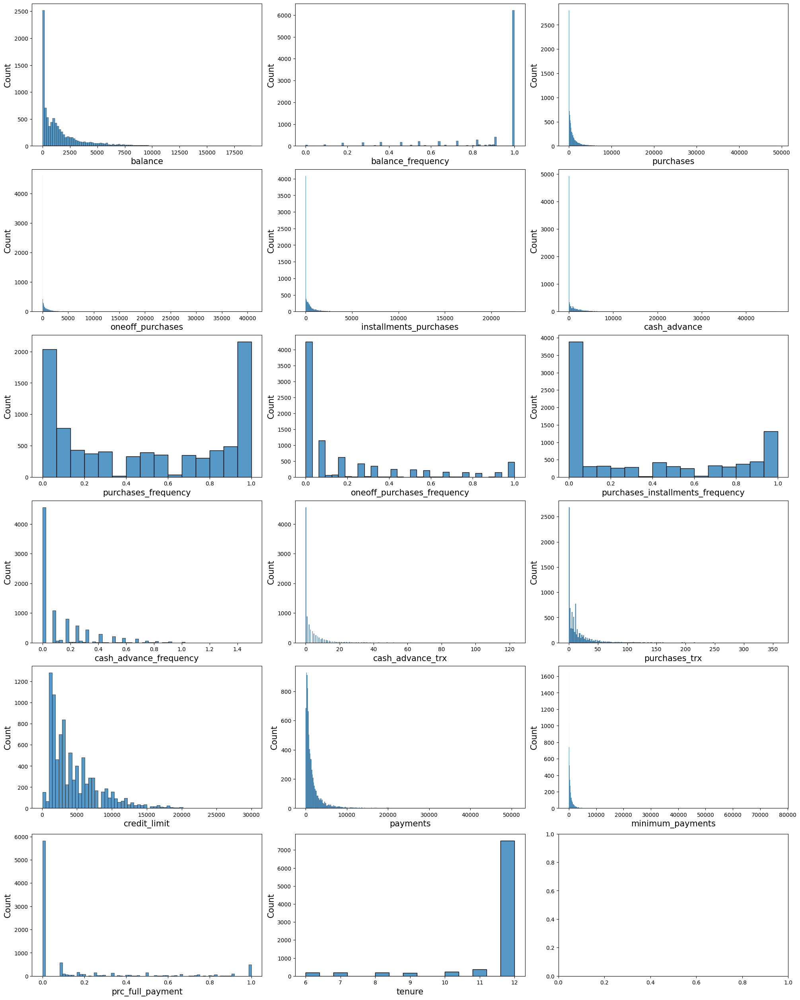

In [9]:
fig, axes = plt.subplots(6, 3, constrained_layout = True, figsize = (20,25))
for c, ax in zip(df.columns[1:], axes.flatten()[:-1]):
    sns.histplot(data = df, x=c, ax = ax)

Sadly there are a lot of outliers, for the moment we will leave it this way

In [10]:
def silhouette_plot(X,start,stop):
    
    score = []
    range_n_clusters = [x for x in range(start,stop+1)] # define the range of k's
    for n_clusters in range_n_clusters:
        # Create a subplot with 1 row and 2 columns
        fig, ax1 = plt.subplots(1)
        fig.set_size_inches(18, 7)

        # The 1st subplot is the silhouette plot
        # The silhouette coefficient can range from -1, 1 but in this example all
        # lie within [-0.1, 1]
        ax1.set_xlim([-0.1, 1])
        # The (n_clusters+1)*10 is for inserting blank space between silhouette
        # plots of individual clusters, to demarcate them clearly.
        ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

        # Initialize the clusterer with n_clusters value and a random generator
        # seed of 10 for reproducibility.
        clusterer = KMeans(n_clusters=n_clusters, random_state=10)
        cluster_labels = clusterer.fit_predict(X)

        # The silhouette_score gives the average value for all the samples.
        # This gives a perspective into the density and separation of the formed
        # clusters
        silhouette_avg = silhouette_score(X, cluster_labels)
        score.append(silhouette_avg)
        print("For n_clusters =", n_clusters,
              "The average silhouette_score is :", silhouette_avg)

        # Compute the silhouette scores for each sample
        sample_silhouette_values = silhouette_samples(X, cluster_labels)

        y_lower = 10
        for i in range(n_clusters):
            # Aggregate the silhouette scores for samples belonging to
            # cluster i, and sort them
            ith_cluster_silhouette_values = \
                sample_silhouette_values[cluster_labels == i]

            ith_cluster_silhouette_values.sort()

            size_cluster_i = ith_cluster_silhouette_values.shape[0]
            y_upper = y_lower + size_cluster_i

            color = cm.nipy_spectral(float(i) / n_clusters)
            ax1.fill_betweenx(np.arange(y_lower, y_upper),
                              0, ith_cluster_silhouette_values,
                              facecolor=color, edgecolor=color, alpha=0.7)

            # Label the silhouette plots with their cluster numbers at the middle
            ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

            # Compute the new y_lower for next plot
            y_lower = y_upper + 10  # 10 for the 0 samples

        ax1.set_title("The silhouette plot for the various clusters.")
        ax1.set_xlabel("The silhouette coefficient values")
        ax1.set_ylabel("Cluster label")

        # The vertical line for average silhouette score of all the values
        ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

        ax1.set_yticks([])  # Clear the yaxis labels / ticks
        ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

        plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                      "with n_clusters = %d" % n_clusters),
                     fontsize=14, fontweight='bold')
    
    plt.show()
    sns.lineplot(x=np.arange(start,stop+1,1), y=score)
    plt.ylabel('silhouette average score')
    plt.xlabel('k')
    plt.grid()

For n_clusters = 2 The average silhouette_score is : 0.21062985278823312
For n_clusters = 3 The average silhouette_score is : 0.24947504096234516
For n_clusters = 4 The average silhouette_score is : 0.1986224452006871
For n_clusters = 5 The average silhouette_score is : 0.1927559688052597
For n_clusters = 6 The average silhouette_score is : 0.20438044852877635
For n_clusters = 7 The average silhouette_score is : 0.21619351213775426
For n_clusters = 8 The average silhouette_score is : 0.22046701812436414


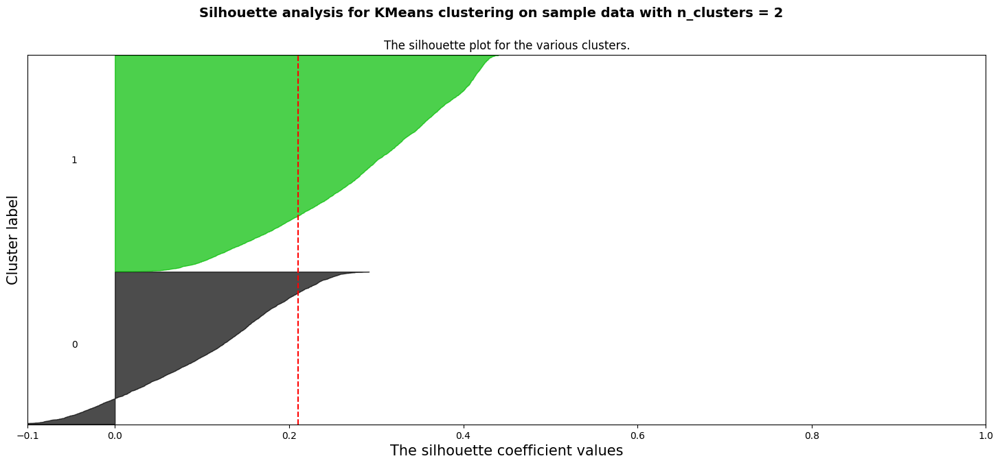

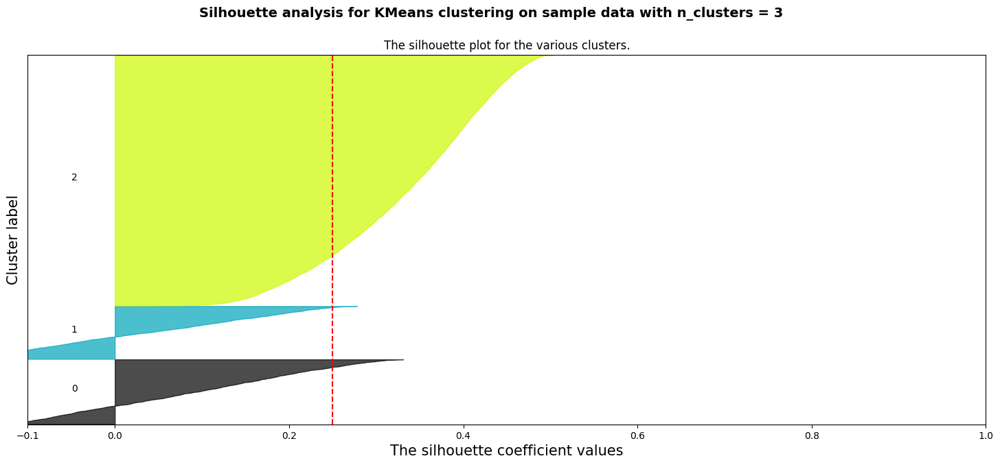

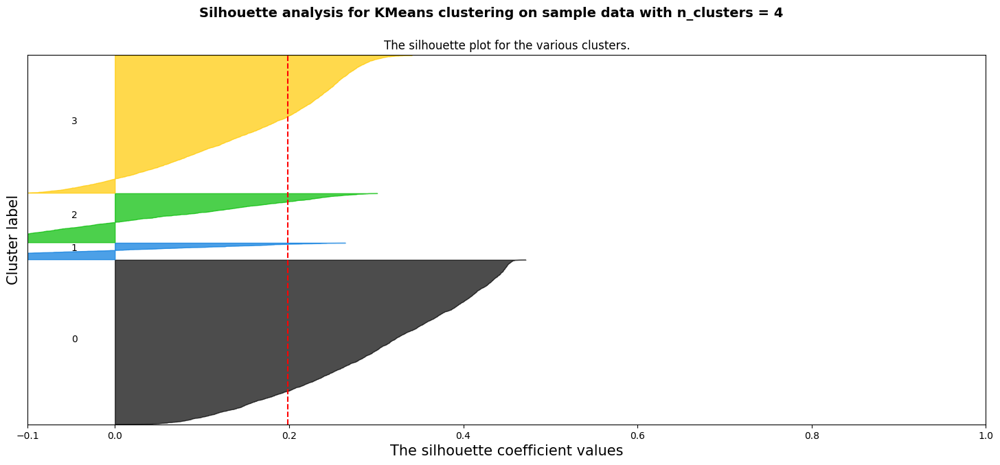

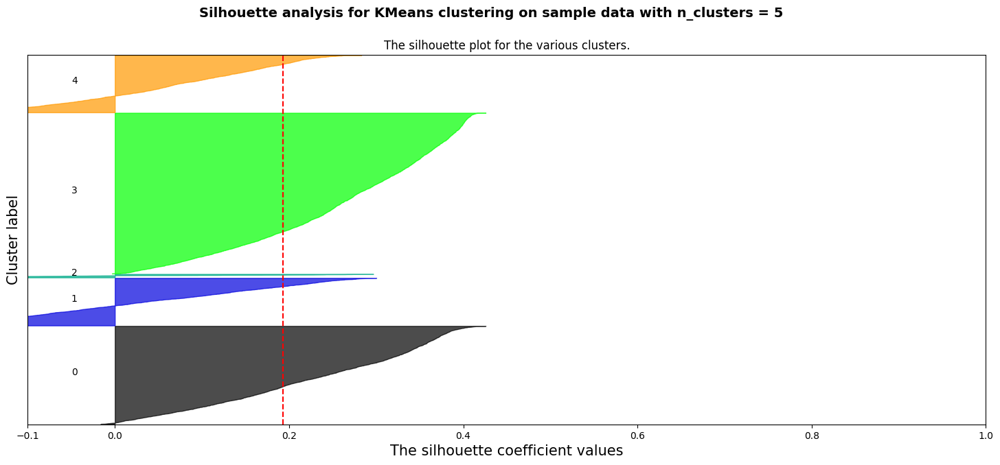

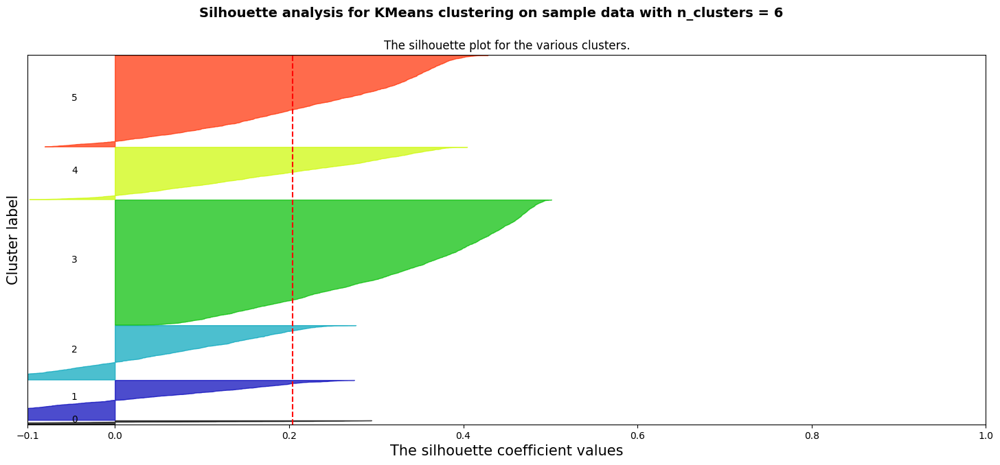

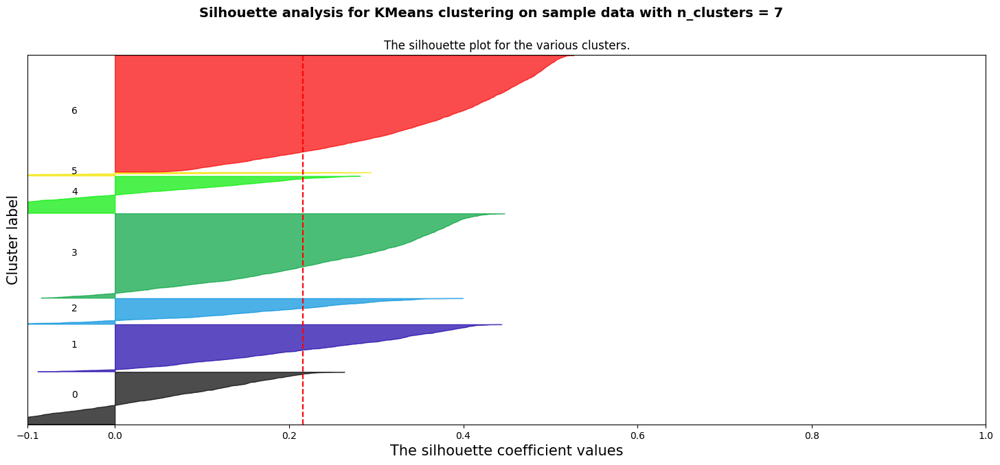

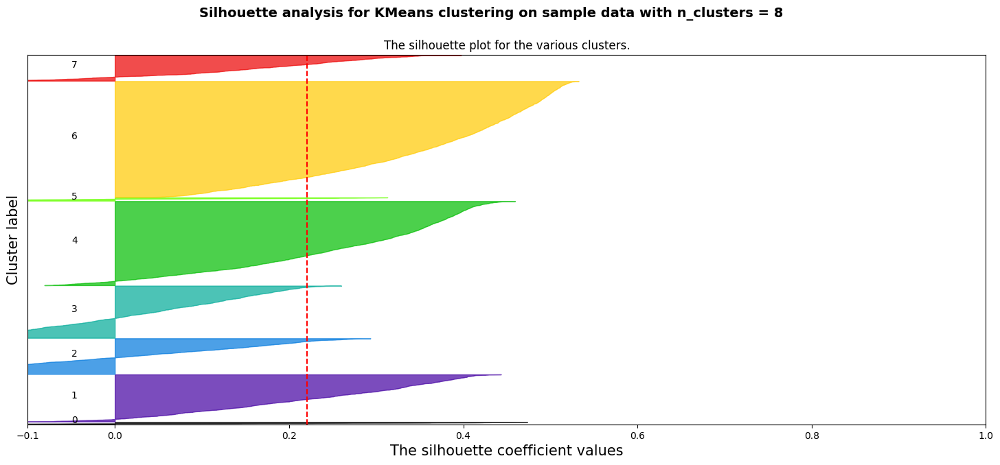

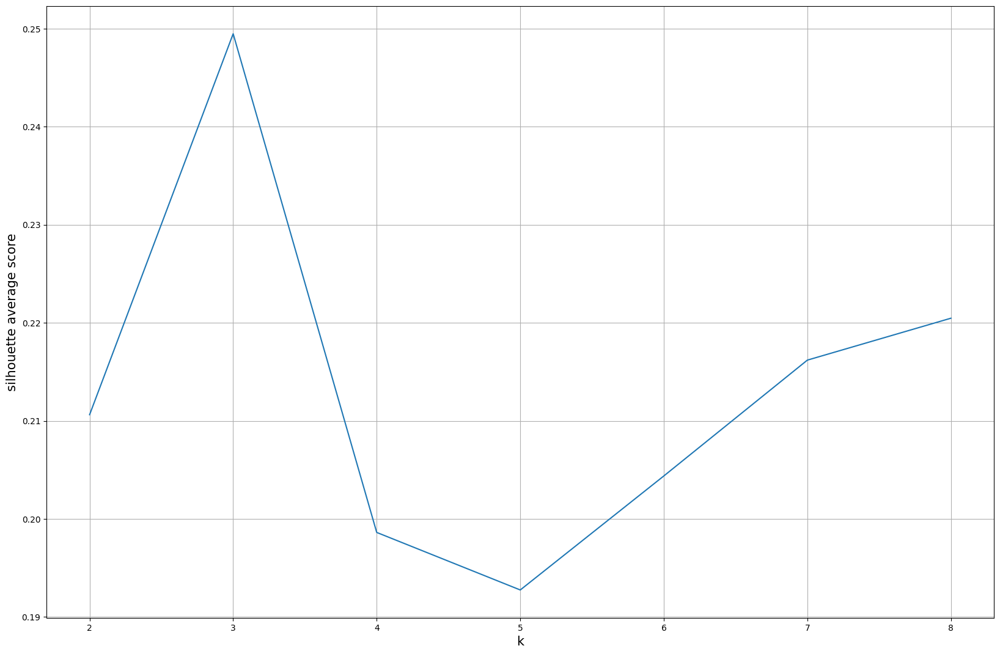

In [11]:
scaler = StandardScaler()
X = scaler.fit_transform(df.drop('cust_id', axis = 1))
silhouette_plot(X,2,8)

As expected the outliers influences too much the outcome, let' try to drop them

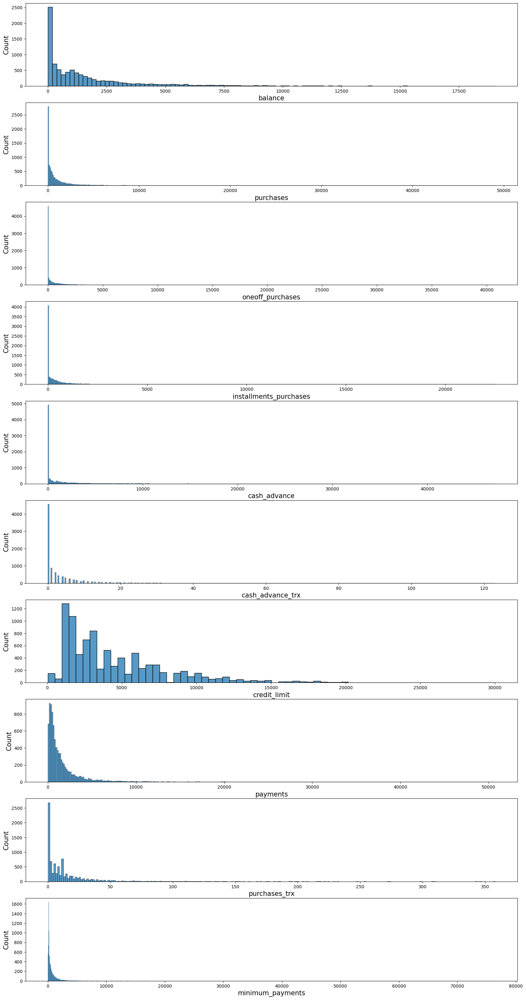

In [12]:
out_col = ['balance','purchases','oneoff_purchases','installments_purchases','cash_advance','cash_advance_trx','credit_limit','payments','purchases_trx','minimum_payments']
fig, axes = plt.subplots(10, figsize = (20,40))
for col, ax in zip(out_col, axes.flatten()):
    sns.histplot(data = df, x=col, ax = ax)

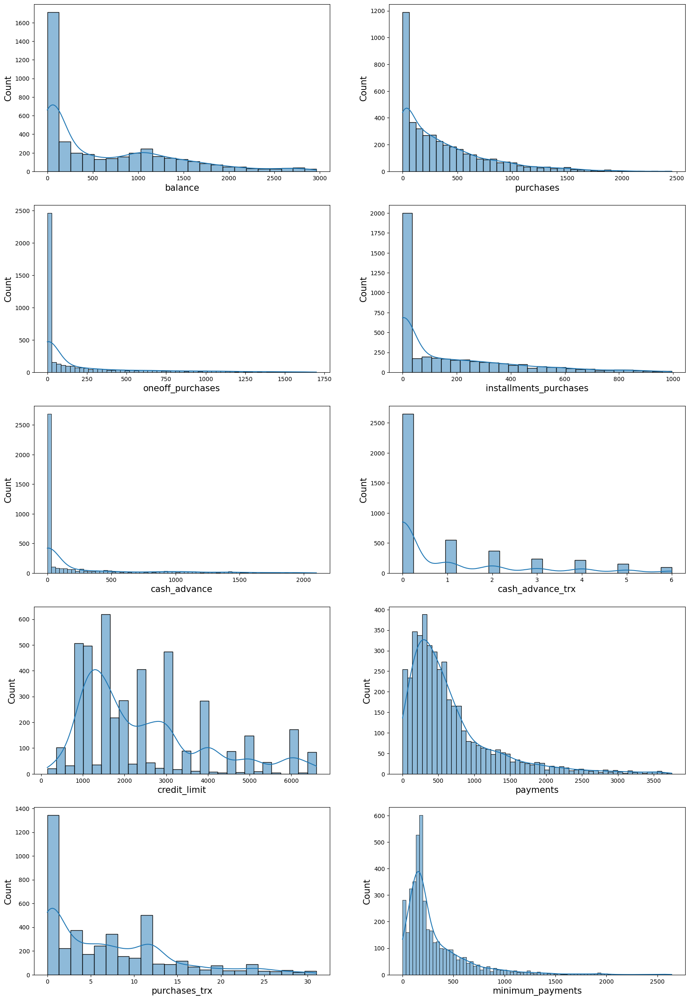

In [13]:
#take the indexes of balance where the values are inferior to the median plus one standard deviation
idx = df[out_col[0]] < (df[out_col[0]].median() + df[out_col[0]].std())

#ieratively updates indexes of dataframe excluding outliers in every columns as specified before
for col in out_col[1:]:
    idx_temp = df[col] < (df[col].median() + df[col].std())
    idx = idx & idx_temp

df_nout = df[idx]
fig, axes = plt.subplots(5,2, figsize = (20,30))
for col, ax in zip(out_col, axes.flatten()):
    sns.histplot(data = df_nout, kde = True, x=col, ax = ax)

It looks like there are less outliers now, let's try to retrain the model

In [14]:
df_nout.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4276 entries, 0 to 8949
Data columns (total 18 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   cust_id                           4276 non-null   object 
 1   balance                           4276 non-null   float64
 2   balance_frequency                 4276 non-null   float64
 3   purchases                         4276 non-null   float64
 4   oneoff_purchases                  4276 non-null   float64
 5   installments_purchases            4276 non-null   float64
 6   cash_advance                      4276 non-null   float64
 7   purchases_frequency               4276 non-null   float64
 8   oneoff_purchases_frequency        4276 non-null   float64
 9   purchases_installments_frequency  4276 non-null   float64
 10  cash_advance_frequency            4276 non-null   float64
 11  cash_advance_trx                  4276 non-null   int64  
 12  purcha

For n_clusters = 2 The average silhouette_score is : 0.19825775948962082
For n_clusters = 3 The average silhouette_score is : 0.2112980618527064
For n_clusters = 4 The average silhouette_score is : 0.18342903696924256
For n_clusters = 5 The average silhouette_score is : 0.17307389783065072
For n_clusters = 6 The average silhouette_score is : 0.17547815977694195
For n_clusters = 7 The average silhouette_score is : 0.17740832244292218
For n_clusters = 8 The average silhouette_score is : 0.16080743882099852


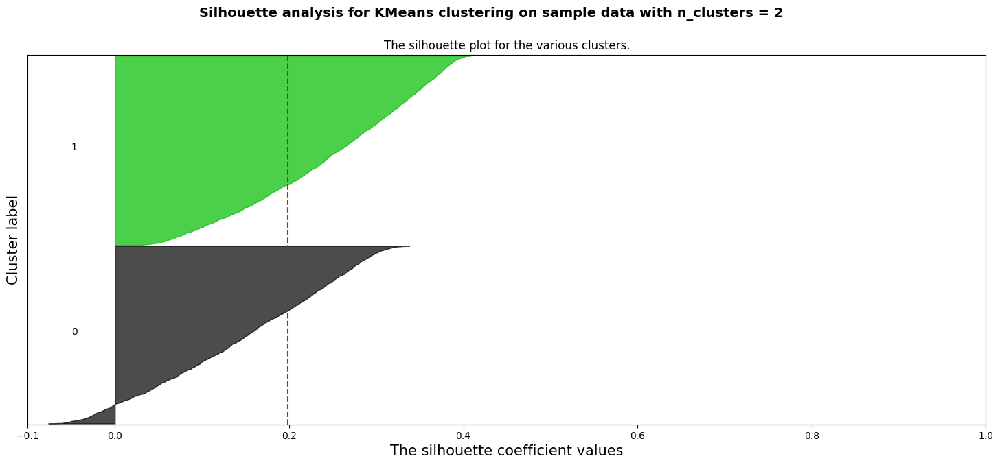

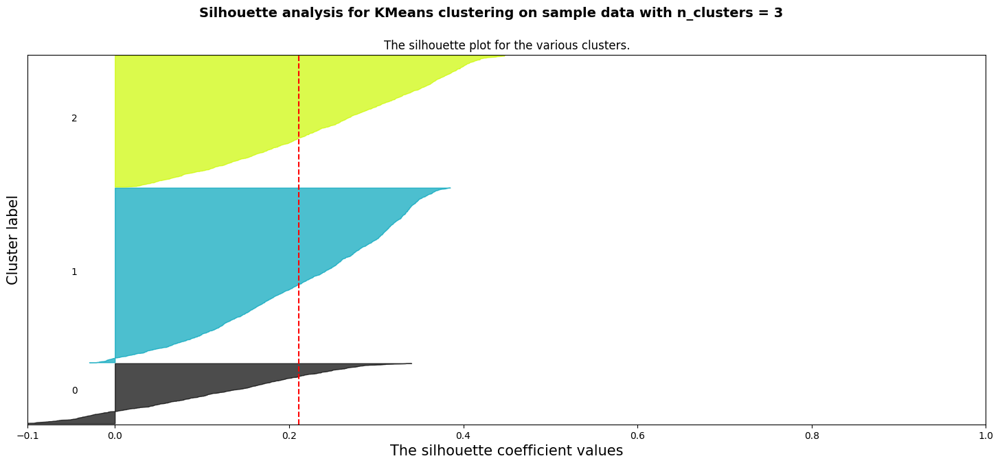

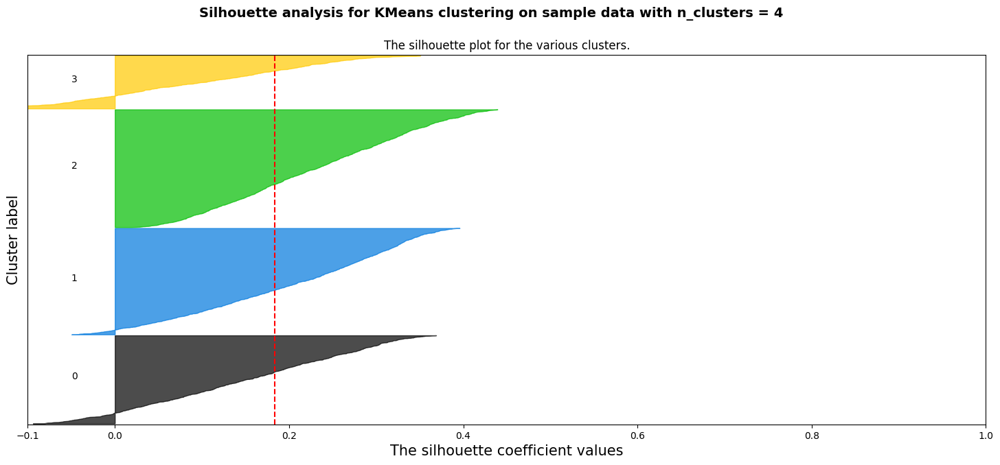

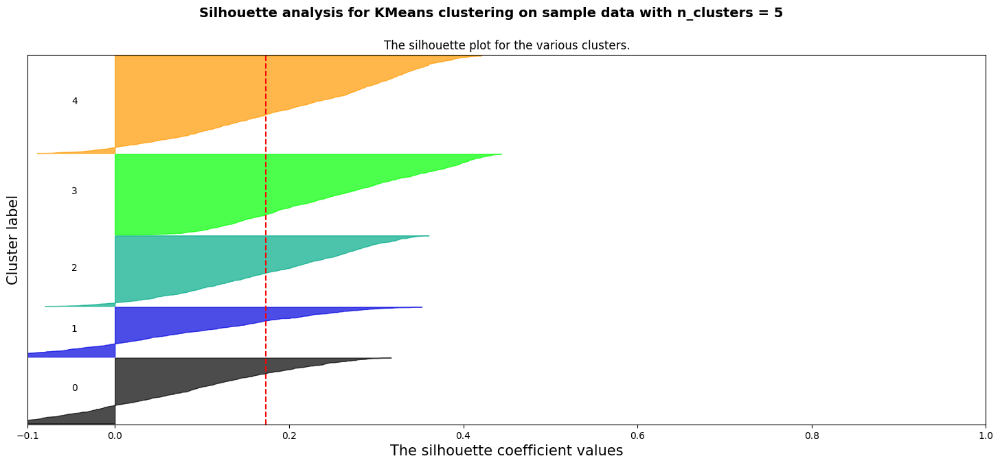

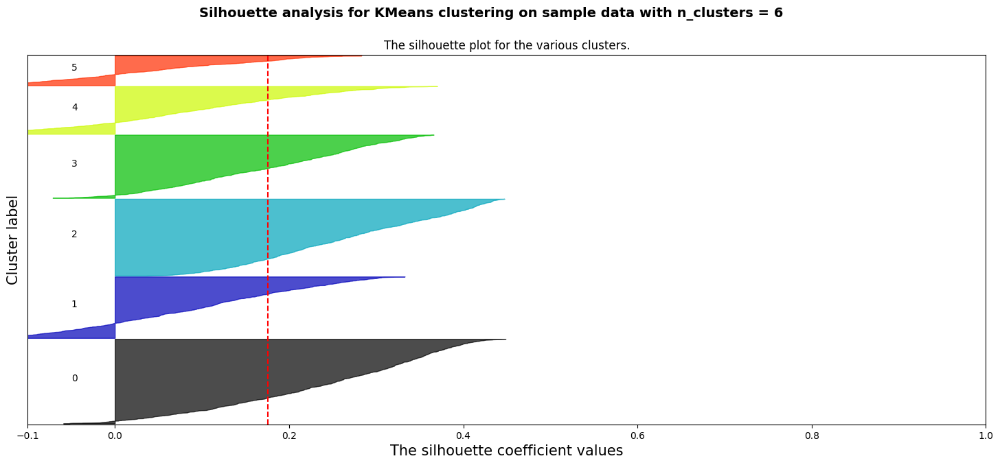

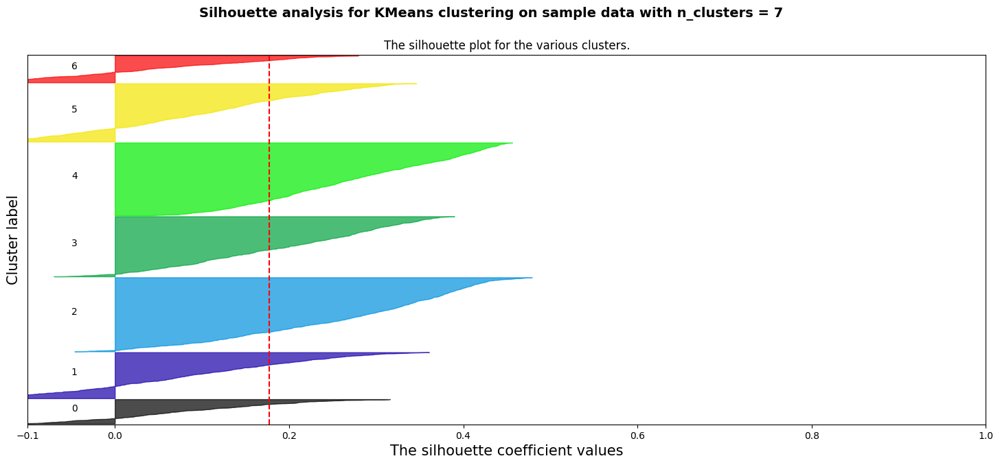

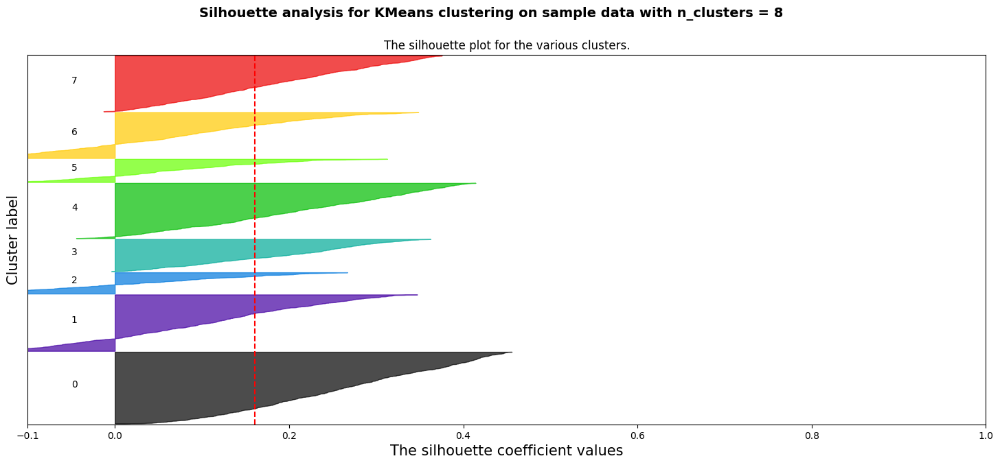

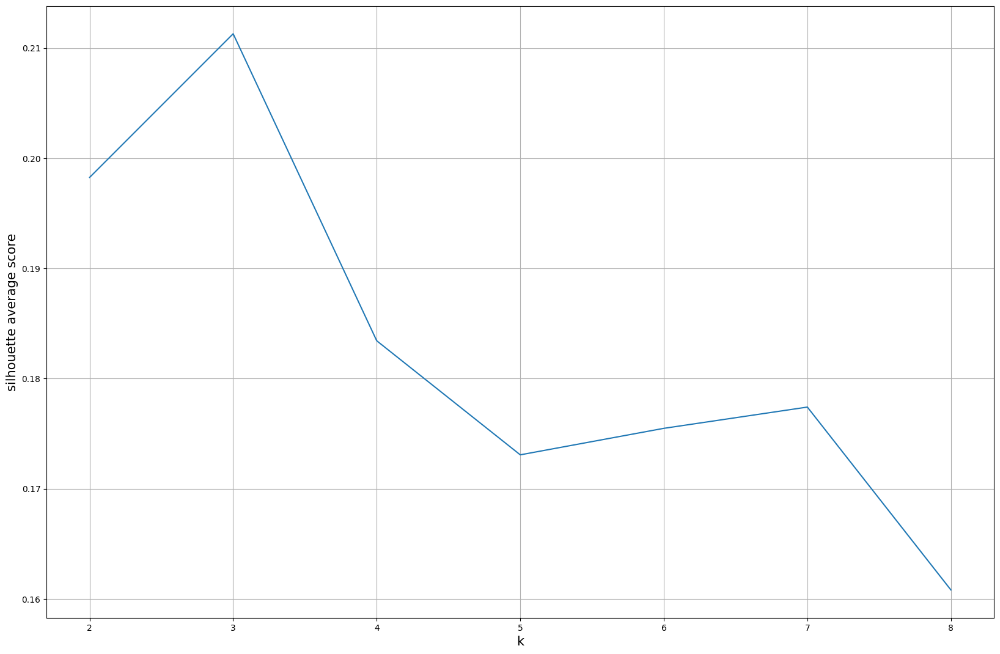

In [15]:
scaler = StandardScaler()
X = scaler.fit_transform(df_nout.drop('cust_id', axis = 1))
silhouette_plot(X,2,8)

Performances are slightly worse, but we can say that k = 3 achieved the best score in both analysis so it will be more convenient to separate the customers in 3 clusters.
<br>
Let's try with dbscan

In [16]:
avg = []
for eps in np.arange(1,2,0.1):
    for ms in np.arange(40,80,10):
        dbscan = DBSCAN(eps = eps, min_samples=ms, n_jobs=-1)
        db_labels = dbscan.fit_predict(X)
        silhouette_avg = silhouette_score(X, db_labels)
        avg.append(silhouette_avg)
        print(f'silhouette average for eps {np.round(eps,2)} and min_samples {ms} = {silhouette_avg} | clusters {np.unique(db_labels)}')

silhouette average for eps 1.0 and min_samples 40 = -0.2628734530856965 | clusters [-1  0  1  2  3]
silhouette average for eps 1.0 and min_samples 50 = -0.1252492388317162 | clusters [-1  0]
silhouette average for eps 1.0 and min_samples 60 = -0.13014426824014205 | clusters [-1  0]
silhouette average for eps 1.0 and min_samples 70 = -0.13115813720197111 | clusters [-1  0]
silhouette average for eps 1.1 and min_samples 40 = -0.16670845993528444 | clusters [-1  0  1  2]
silhouette average for eps 1.1 and min_samples 50 = -0.20774979543717761 | clusters [-1  0  1  2]
silhouette average for eps 1.1 and min_samples 60 = -0.25900142043747826 | clusters [-1  0  1  2]
silhouette average for eps 1.1 and min_samples 70 = -0.1040405198943323 | clusters [-1  0]
silhouette average for eps 1.2 and min_samples 40 = -0.157641519339799 | clusters [-1  0  1  2]
silhouette average for eps 1.2 and min_samples 50 = -0.14865935370567654 | clusters [-1  0  1  2]
silhouette average for eps 1.2 and min_samples

Text(220.72222222222223, 0.5, 'eps')

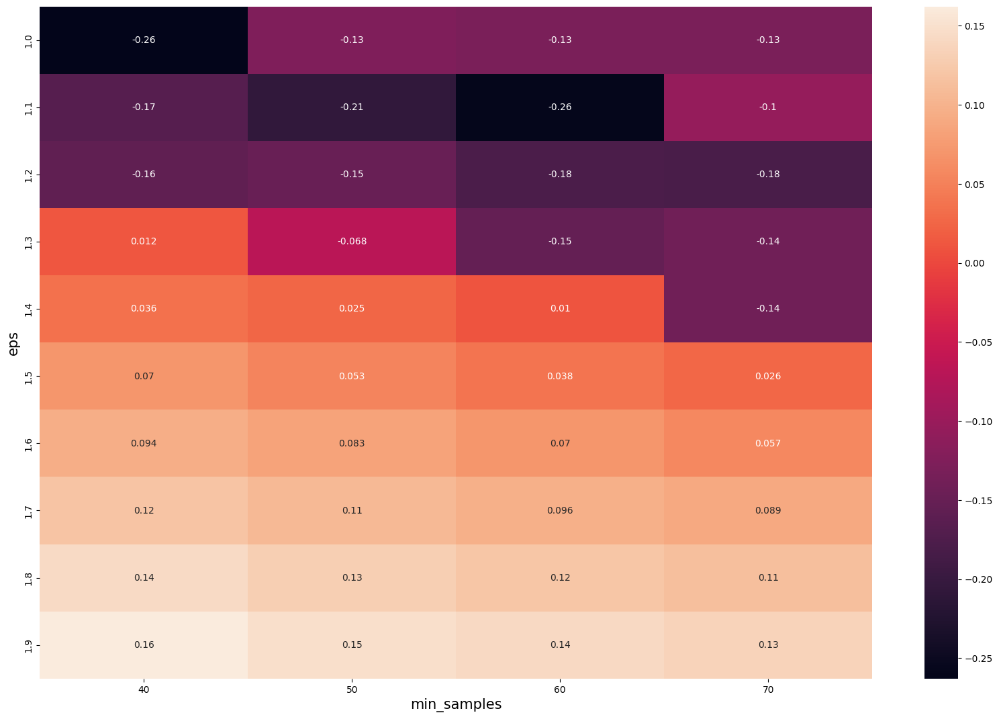

In [17]:
avg = np.array(avg).reshape(10,4)
df_avg = pd.DataFrame(avg, columns = np.arange(40,80,10), index = np.arange(1,2,0.1).round(2))
sns.heatmap(df_avg, annot = True)
plt.xlabel('min_samples')
plt.ylabel('eps')

Even if the value of silhouette score is increasing with eps, looking at the clusters we can see that there is only one class (0) and noise (-1) when scores are positive.
<br>
So for this case the best option will be k-means with k = 3

### Exercise 2

Try to apply $k$-means to digits dataset.

The aim of the exercise is to identify similar digits without using the original label information.
You can thin to this as similar to a first step in extracting meaning from a new dataset about which you do not have any _a priori_ label information.

Recall that the digits consist of $1797$ samples with $64$ features, where each of the $64$ features is the brightness of one pixel in an $8\times8$ image.

The result should be $10$ clusters in $64$ dimensions.
Notice that the cluster centroids themselves are $64$-dimensional points, and can themselves be interpreted as the "typical" digit within the cluster.

Write a code to plot what these cluster centers look like.

**Hint**: even if you are in an unsupervised context, you actually have labels, use theme to measure yur algorithm performance.

In [18]:
data, target = datasets.load_digits(return_X_y=True, as_frame=True)
data

,pixel_0_0,pixel_0_1,pixel_0_2,pixel_0_3,pixel_0_4,pixel_0_5,pixel_0_6,pixel_0_7,pixel_1_0,pixel_1_1,...,pixel_6_6,pixel_6_7,pixel_7_0,pixel_7_1,pixel_7_2,pixel_7_3,pixel_7_4,pixel_7_5,pixel_7_6,pixel_7_7
0,0.0,0.0,5.0,13.0,9.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,6.0,13.0,10.0,0.0,0.0,0.0
1,0.0,0.0,0.0,12.0,13.0,5.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,11.0,16.0,10.0,0.0,0.0
2,0.0,0.0,0.0,4.0,15.0,12.0,0.0,0.0,0.0,0.0,...,5.0,0.0,0.0,0.0,0.0,3.0,11.0,16.0,9.0,0.0
3,0.0,0.0,7.0,15.0,13.0,1.0,0.0,0.0,0.0,8.0,...,9.0,0.0,0.0,0.0,7.0,13.0,13.0,9.0,0.0,0.0
4,0.0,0.0,0.0,1.0,11.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,2.0,16.0,4.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1792,0.0,0.0,4.0,10.0,13.0,6.0,0.0,0.0,0.0,1.0,...,4.0,0.0,0.0,0.0,2.0,14.0,15.0,9.0,0.0,0.0
1793,0.0,0.0,6.0,16.0,13.0,11.0,1.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,6.0,16.0,14.0,6.0,0.0,0.0
1794,0.0,0.0,1.0,11.0,15.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,2.0,9.0,13.0,6.0,0.0,0.0
1795,0.0,0.0,2.0,10.0,7.0,0.0,0.0,0.0,0.0,0.0,...,2.0,0.0,0.0,0.0,5.0,12.0,16.0,12.0,0.0,0.0


In [19]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1797 entries, 0 to 1796
Data columns (total 64 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   pixel_0_0  1797 non-null   float64
 1   pixel_0_1  1797 non-null   float64
 2   pixel_0_2  1797 non-null   float64
 3   pixel_0_3  1797 non-null   float64
 4   pixel_0_4  1797 non-null   float64
 5   pixel_0_5  1797 non-null   float64
 6   pixel_0_6  1797 non-null   float64
 7   pixel_0_7  1797 non-null   float64
 8   pixel_1_0  1797 non-null   float64
 9   pixel_1_1  1797 non-null   float64
 10  pixel_1_2  1797 non-null   float64
 11  pixel_1_3  1797 non-null   float64
 12  pixel_1_4  1797 non-null   float64
 13  pixel_1_5  1797 non-null   float64
 14  pixel_1_6  1797 non-null   float64
 15  pixel_1_7  1797 non-null   float64
 16  pixel_2_0  1797 non-null   float64
 17  pixel_2_1  1797 non-null   float64
 18  pixel_2_2  1797 non-null   float64
 19  pixel_2_3  1797 non-null   float64
 20  pixel_2_

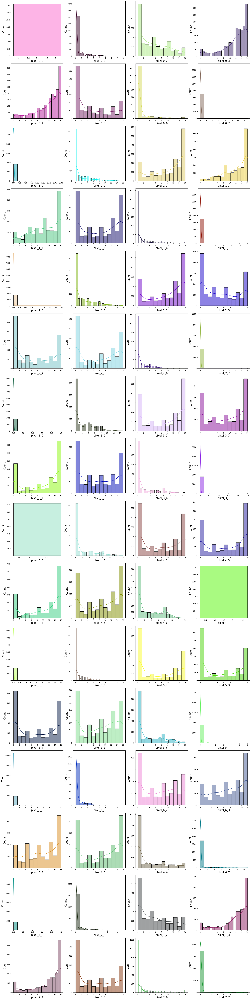

In [20]:
fig, axes = plt.subplots(16,4, constrained_layout = True, figsize=(20,80))
for col, ax in zip(data.columns, axes.flatten()):
    sns.histplot(data, x=col, color=np.random.random(3), kde=True, ax = ax)

The dataset is clean so won't be analyzed any further

For n_clusters = 8 The average silhouette_score is : 0.17827027818558747
For n_clusters = 9 The average silhouette_score is : 0.18801476754095453
For n_clusters = 10 The average silhouette_score is : 0.18110486324411054
For n_clusters = 11 The average silhouette_score is : 0.1792389394150335
For n_clusters = 12 The average silhouette_score is : 0.18150449090913218


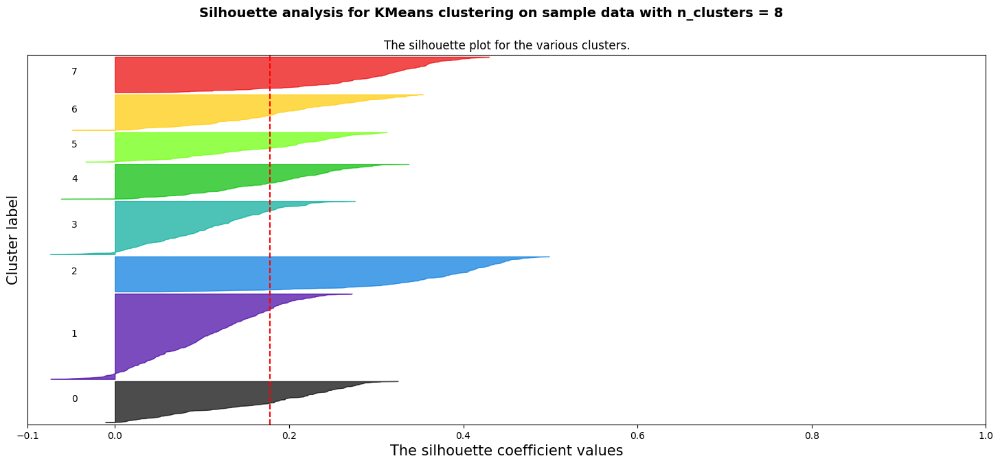

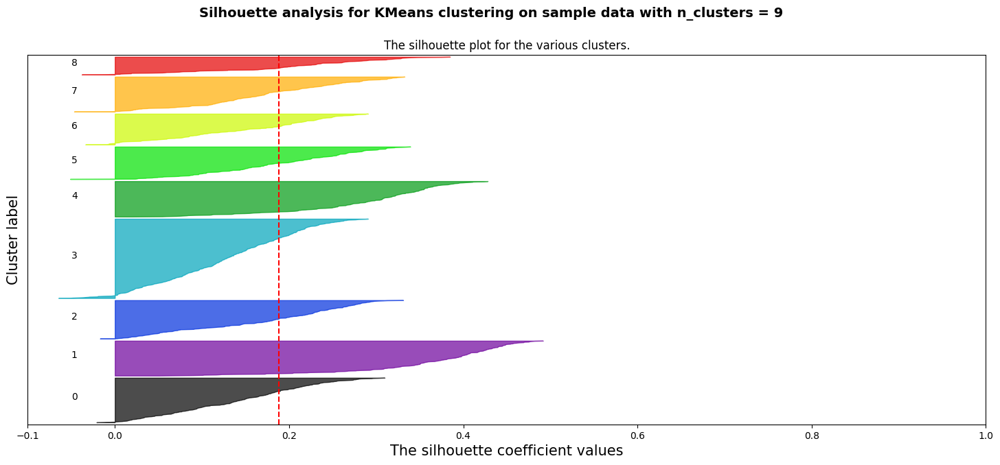

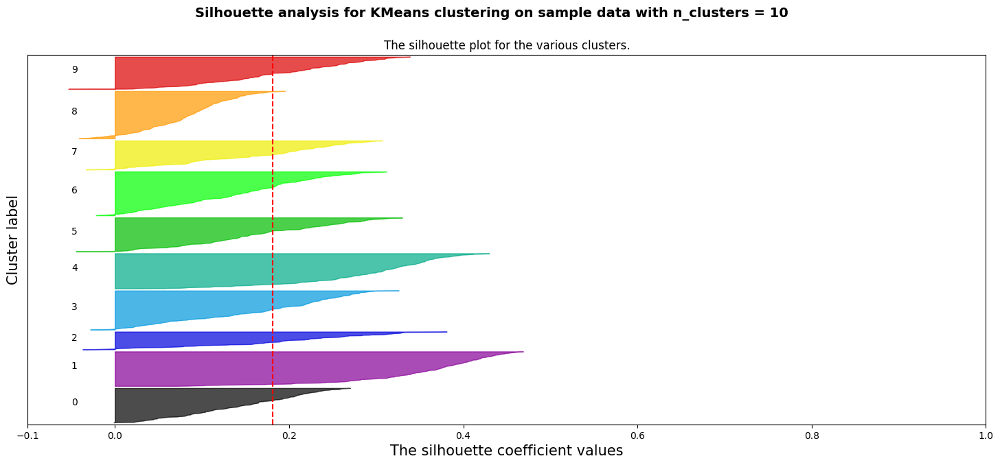

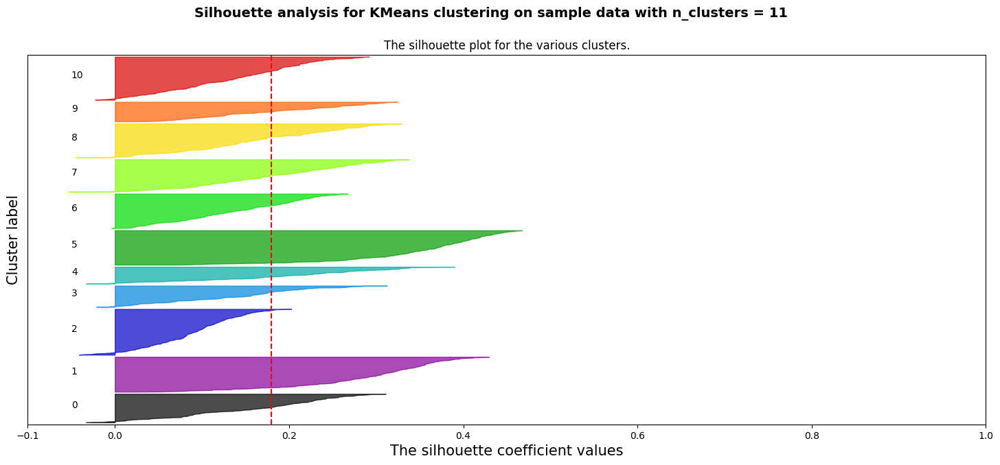

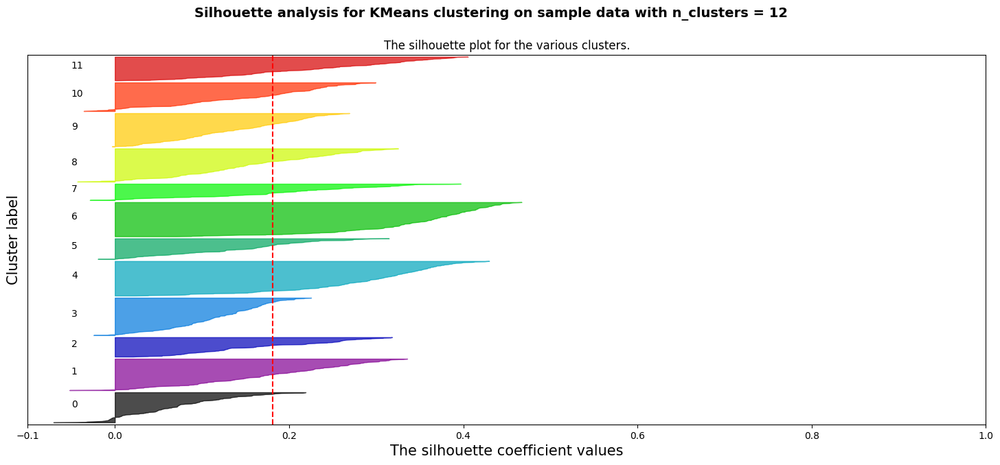

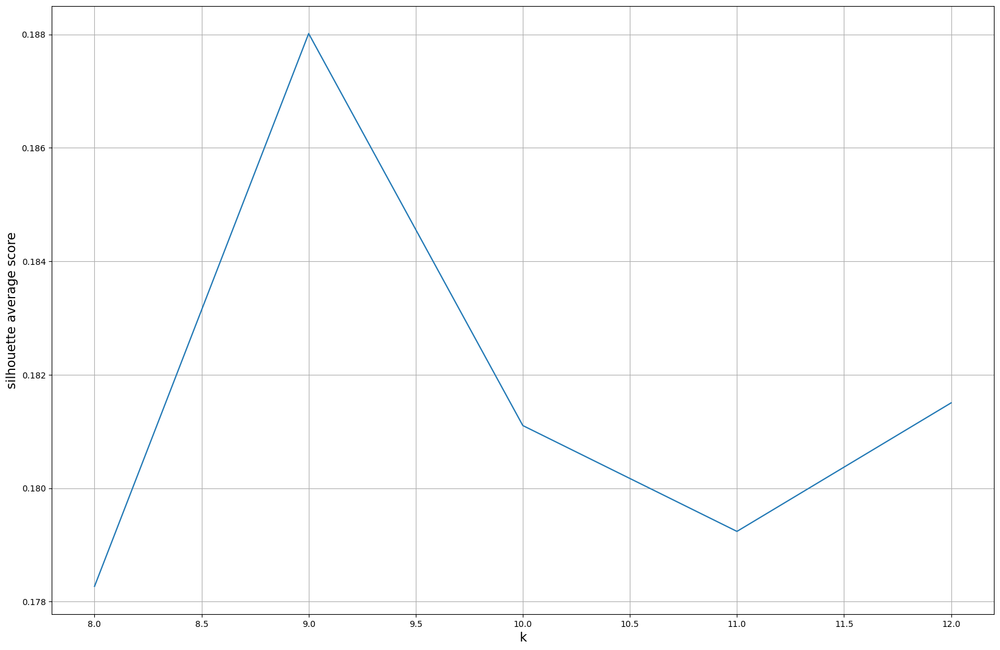

In [38]:
scaler = MinMaxScaler()
X = scaler.fit_transform(data)
silhouette_plot(X,8,12)

Let's see how centroids are made

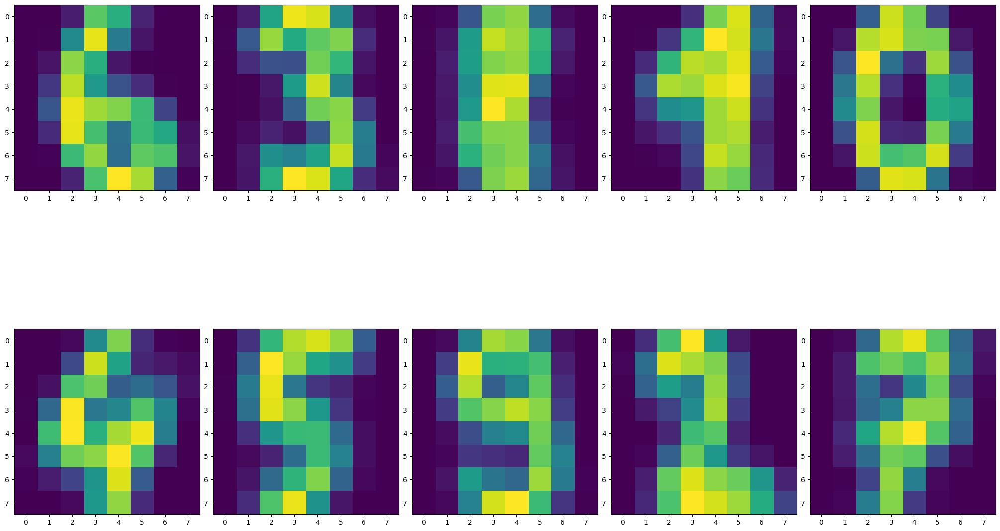

In [39]:
kmeans = KMeans(10)
labels = kmeans.fit_predict(X)
centroids = kmeans.cluster_centers_
fig, axes = plt.subplots(2, 5, constrained_layout = True)
for cen, ax in zip(centroids, axes.flatten()):
    ax.imshow(cen.reshape(8,8))

Centroids resemble real numbers, which is good, but as we can see the number 8 is not represented really well.
<br>
In fact looking at the silhouette score we see that the highest score is for 9 clusters. 

In [41]:
mapp = {0:6, 1:3, 2:8, 3:1, 4:0, 5:4, 6:5, 7:9, 8:2, 9:7}
mapped = []
for elem in labels:
    mapped.append(mapp[elem])
    
accuracy_score(mapped, target)

0.7890929326655537

We can see that comparing the labels we have an 79% accuracy 

### Exercise 3

Use the [Mall Customer dataset](https://raw.githubusercontent.com/oscar-defelice/DSAcademy-lectures/master/Lectures_src/07.Unsupervised_learning/datasets/Mall_Customers.csv) and cluster them in spending groups, that is groups with somehow homogeneous _spending scores_.

The exercise should contain $5$ steps:

1. Problem statement
2. Data Analysis
3. Data processing
4. The clustering algorithm and related choices
   - Clustering plots
5. Takeaways

**BONUS**: An appropriate EDA and nice data visualisation.

In [24]:
mc_url = 'https://raw.githubusercontent.com/oscar-defelice/DSAcademy-lectures/master/Lectures_src/07.Unsupervised_learning/datasets/Mall_Customers.csv'
mc_data = pd.read_csv(mc_url)
mc_data

,CustomerID,Gender,Age,Annual Income (k$),Spending Score (1-100)
0,1,Male,19,15,39
1,2,Male,21,15,81
2,3,Female,20,16,6
3,4,Female,23,16,77
4,5,Female,31,17,40
...,...,...,...,...,...
195,196,Female,35,120,79
196,197,Female,45,126,28
197,198,Male,32,126,74
198,199,Male,32,137,18


In [25]:
mc_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200 entries, 0 to 199
Data columns (total 5 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   CustomerID              200 non-null    int64 
 1   Gender                  200 non-null    object
 2   Age                     200 non-null    int64 
 3   Annual Income (k$)      200 non-null    int64 
 4   Spending Score (1-100)  200 non-null    int64 
dtypes: int64(4), object(1)
memory usage: 7.9+ KB


There aren't any missing values, but er need to encode the gender and drop the customer id

In [26]:
customer_id = mc_data['CustomerID']
mc_data = mc_data.drop('CustomerID', axis = 1)

In [27]:
mc_data_enc = pd.get_dummies(mc_data, 'Gender', drop_first=True)
mc_data_enc

,Age,Annual Income (k$),Spending Score (1-100),Gender_Male
0,19,15,39,1
1,21,15,81,1
2,20,16,6,0
3,23,16,77,0
4,31,17,40,0
...,...,...,...,...
195,35,120,79,0
196,45,126,28,0
197,32,126,74,1
198,32,137,18,1


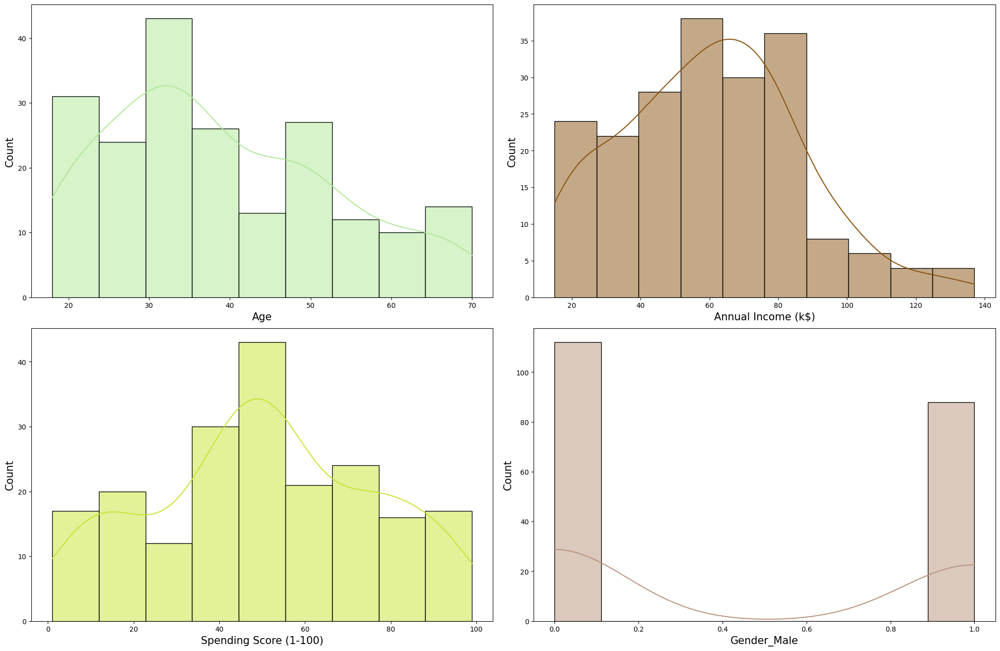

In [28]:
fig, axes = plt.subplots(2,2, constrained_layout=True)
for col, ax in zip(mc_data_enc.columns, axes.flatten()):
    sns.histplot(data=mc_data_enc, x=col, kde=True, color=np.random.rand(3), ax=ax)

We can see that there are a few more female and that there aren't outliers, so let's scale data and train the model

For n_clusters = 2 The average silhouette_score is : 0.2518152915788437
For n_clusters = 3 The average silhouette_score is : 0.25951265087431563
For n_clusters = 4 The average silhouette_score is : 0.3012323168801352
For n_clusters = 5 The average silhouette_score is : 0.31437614343154285
For n_clusters = 6 The average silhouette_score is : 0.31998727491069956
For n_clusters = 7 The average silhouette_score is : 0.3581258657368066
For n_clusters = 8 The average silhouette_score is : 0.38738083581583793
For n_clusters = 9 The average silhouette_score is : 0.4022520246824372
For n_clusters = 10 The average silhouette_score is : 0.42011198117622145
For n_clusters = 11 The average silhouette_score is : 0.4250220513075817
For n_clusters = 12 The average silhouette_score is : 0.4238527077570082
For n_clusters = 13 The average silhouette_score is : 0.42836752677685547
For n_clusters = 14 The average silhouette_score is : 0.4173202640701824
For n_clusters = 15 The average silhouette_score is :

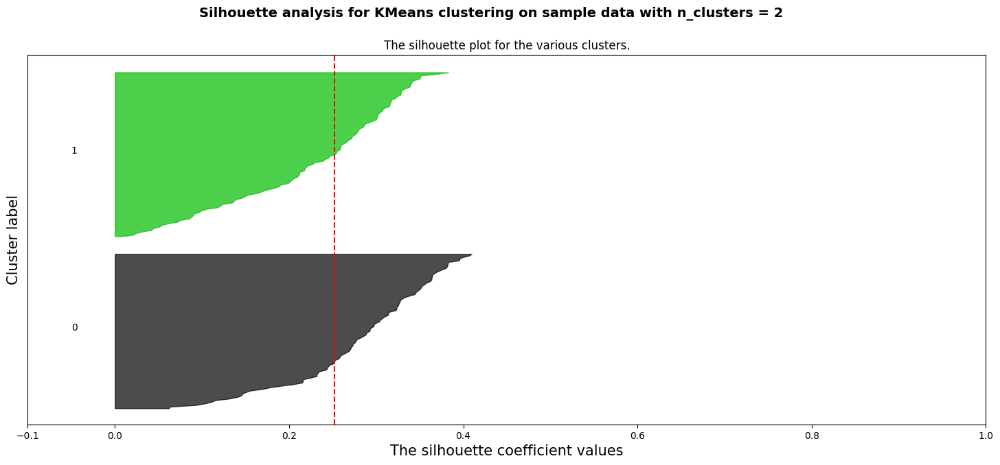

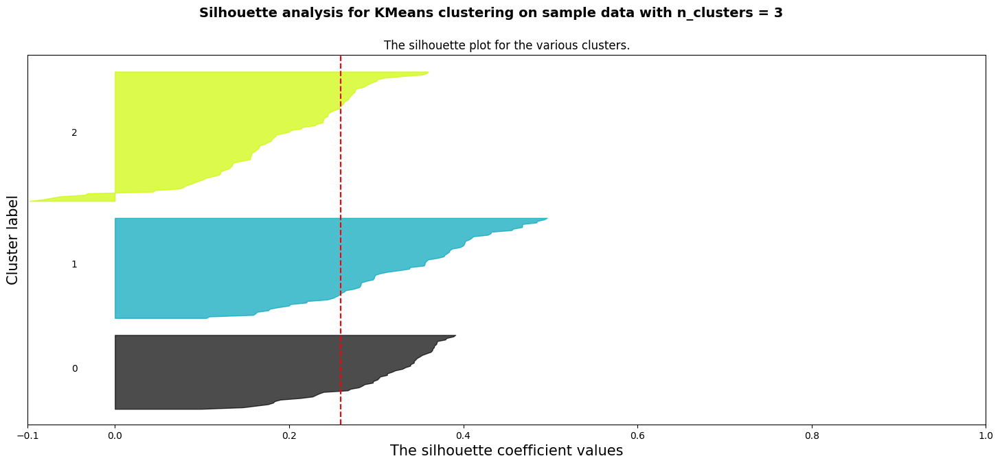

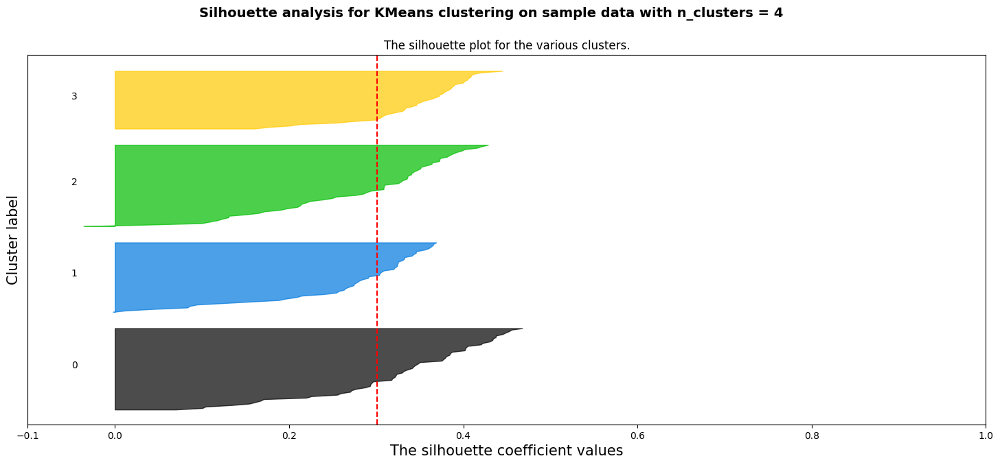

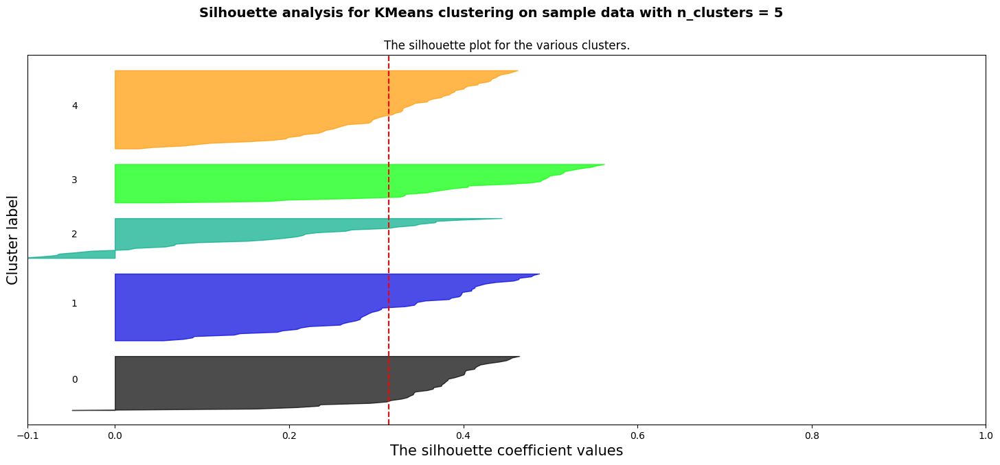

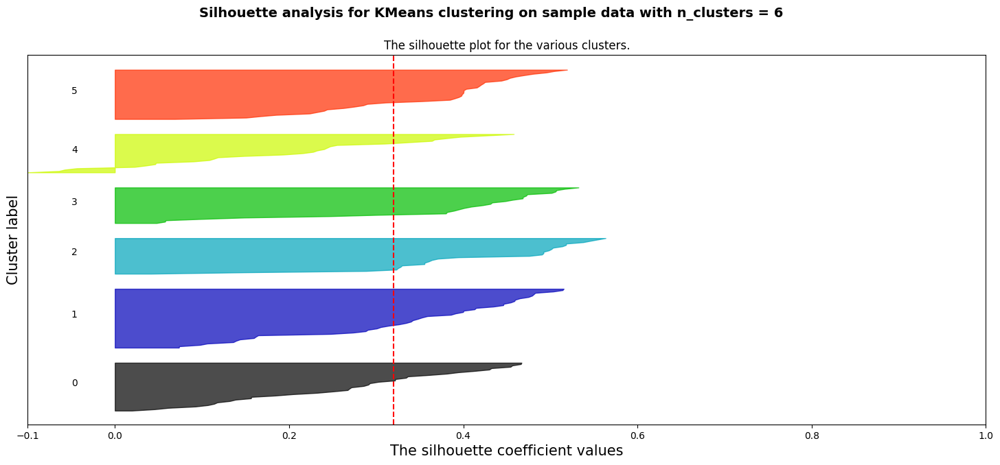

...

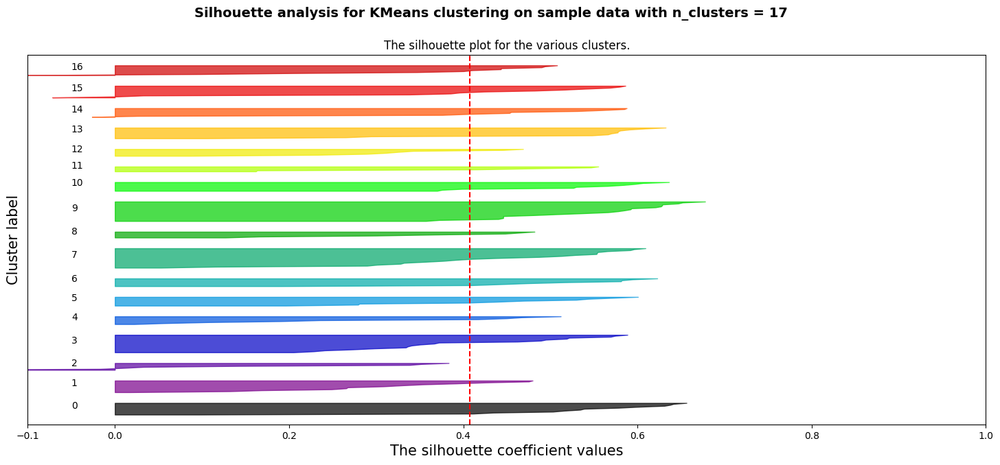

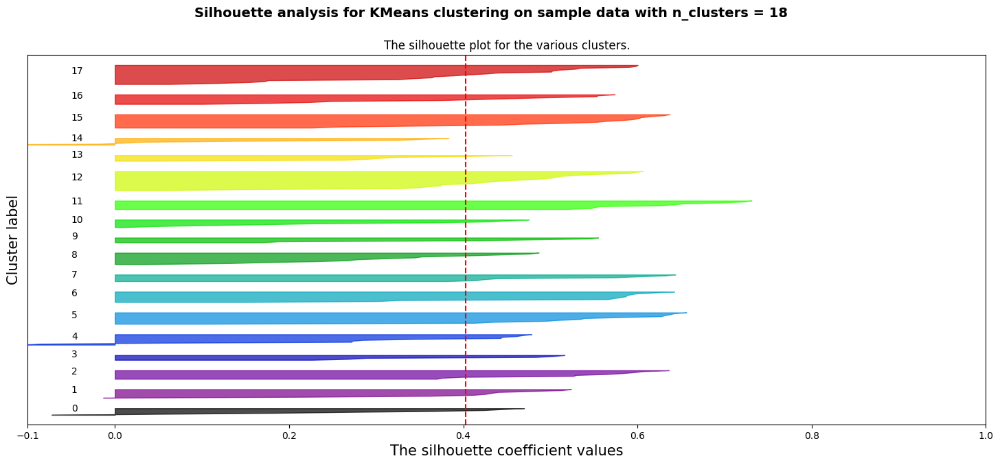

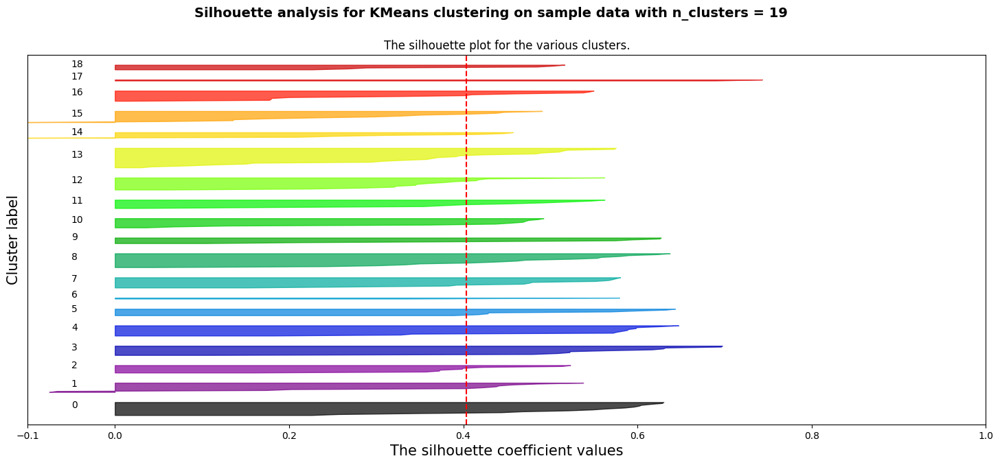

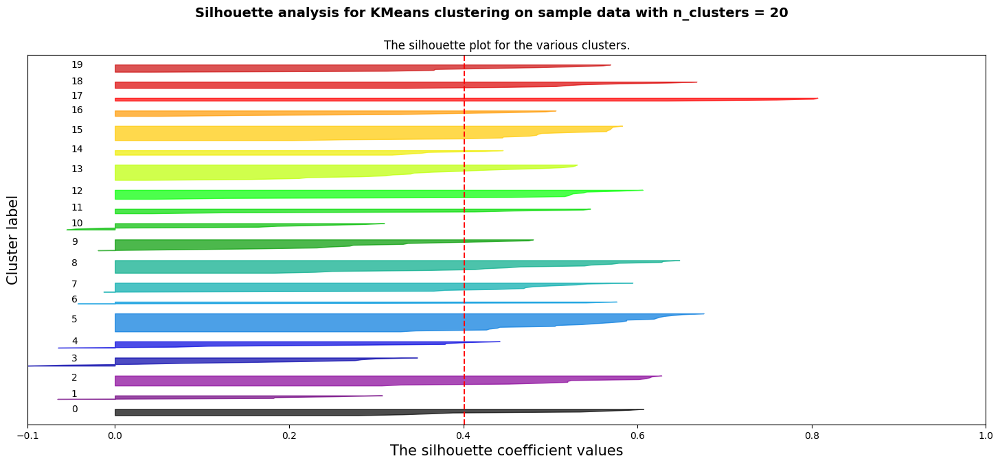

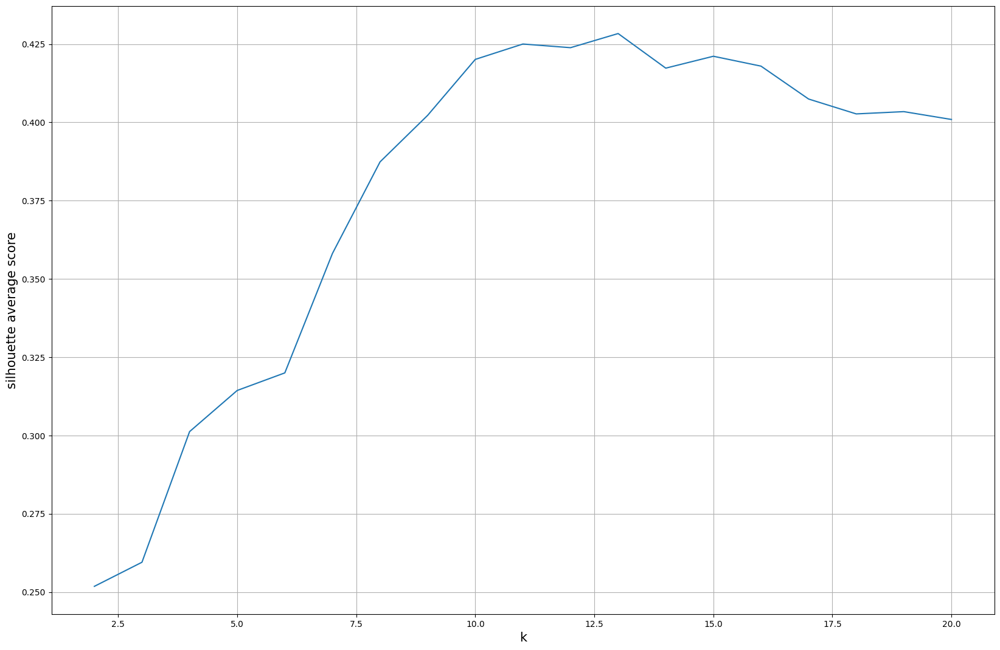

In [29]:
scaler = StandardScaler()
X = scaler.fit_transform(mc_data_enc)
silhouette_plot(X,2,20)

As we can see we have the best silhouette score for 13 clusters, let's try to plot the clusters

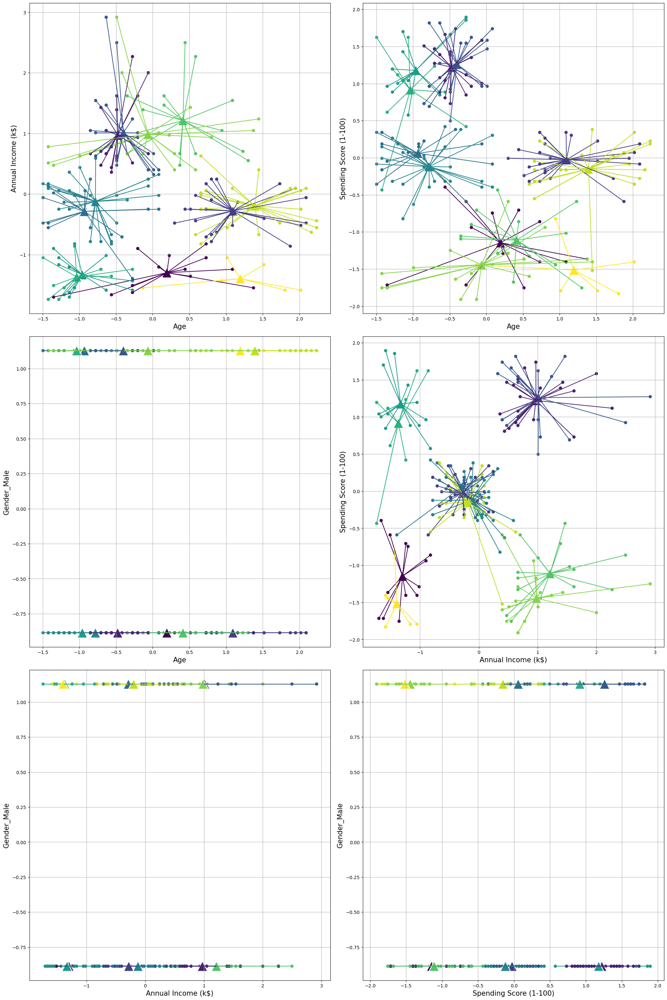

In [30]:
from itertools import combinations
k=12
kmeans = KMeans(k)
labels = kmeans.fit_predict(X)
centroids = kmeans.cluster_centers_
comb = list(combinations([0,1,2,3],2))

fig, axes = plt.subplots(3,2,constrained_layout=True, figsize=(20,30))
for (i, j), ax in zip(comb, axes.flatten()):
        
    sp = ax.scatter(x=X[:,i], y=X[:,j], c=labels)
    sns.scatterplot(x=centroids[:,i], y=centroids[:,j], marker="^", s = 500, c=[x for x in range(0,k)], ax = ax)
    
    for n, (row, l) in enumerate(zip(X,labels)):
        x = (row[i], centroids[l,i])
        y = (row[j], centroids[l,j])
        ax.plot(x, y, c=sp.to_rgba(labels[n]))
        
    ax.set_xlabel(f'{mc_data_enc.columns[i]}')
    ax.set_ylabel(f'{mc_data_enc.columns[j]}')
    ax.grid()

Our task is to find the best clusters which makes homogeneous spending score amongst customers, so we need to check that too.
<br>
From the above graph we can see that clusters could be separated in 3 major clusters considering spending score, tracking horizontal lines when spending score is on y axis.
<br>
Let's try to visualize this better, we will plot distributions of spending score for each cluster on various numbers of cluster

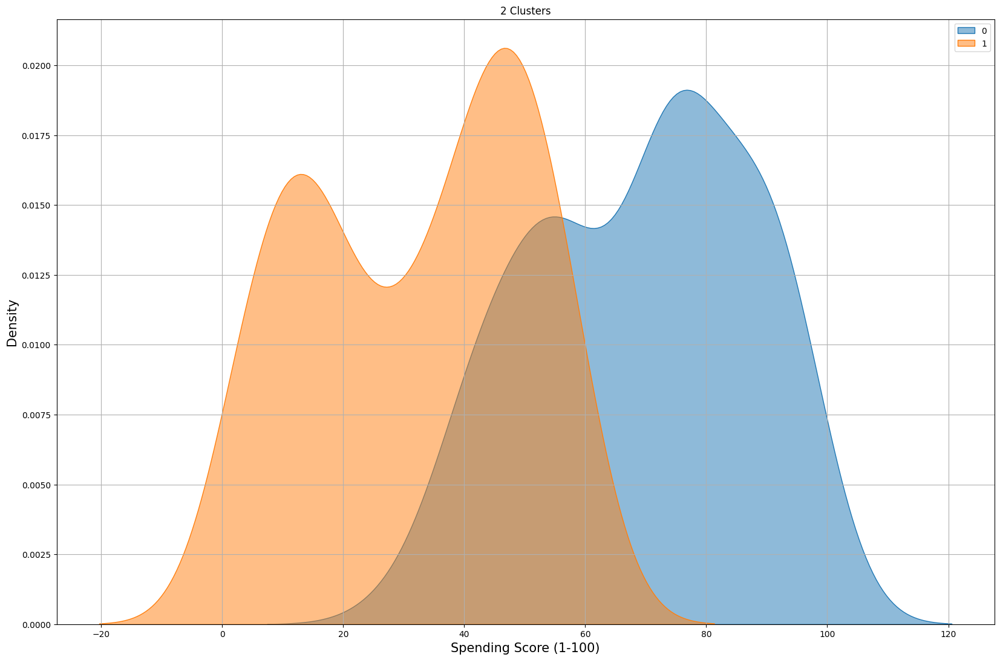

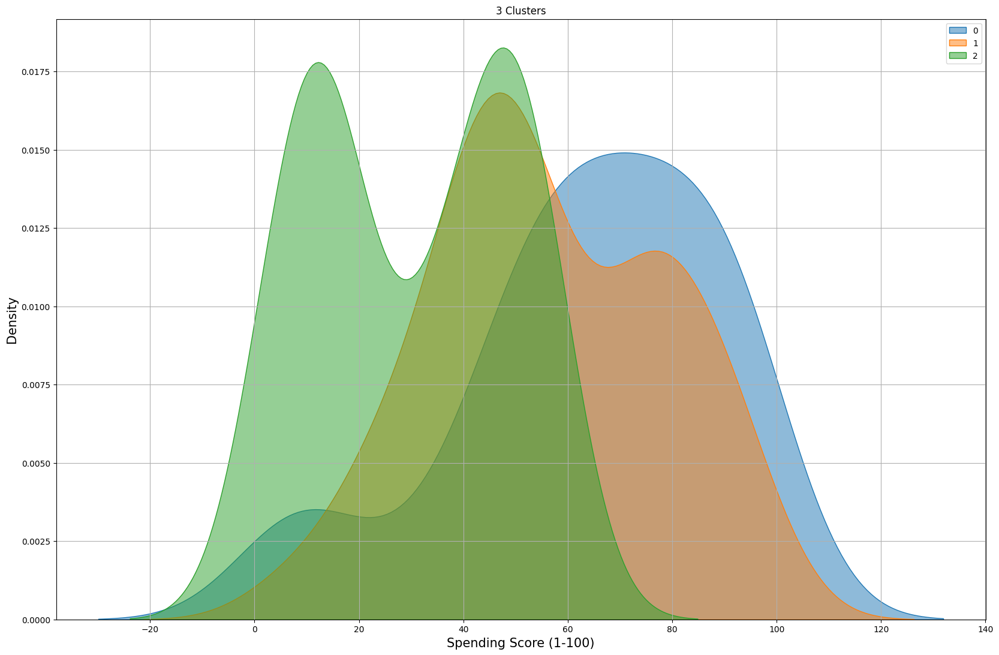

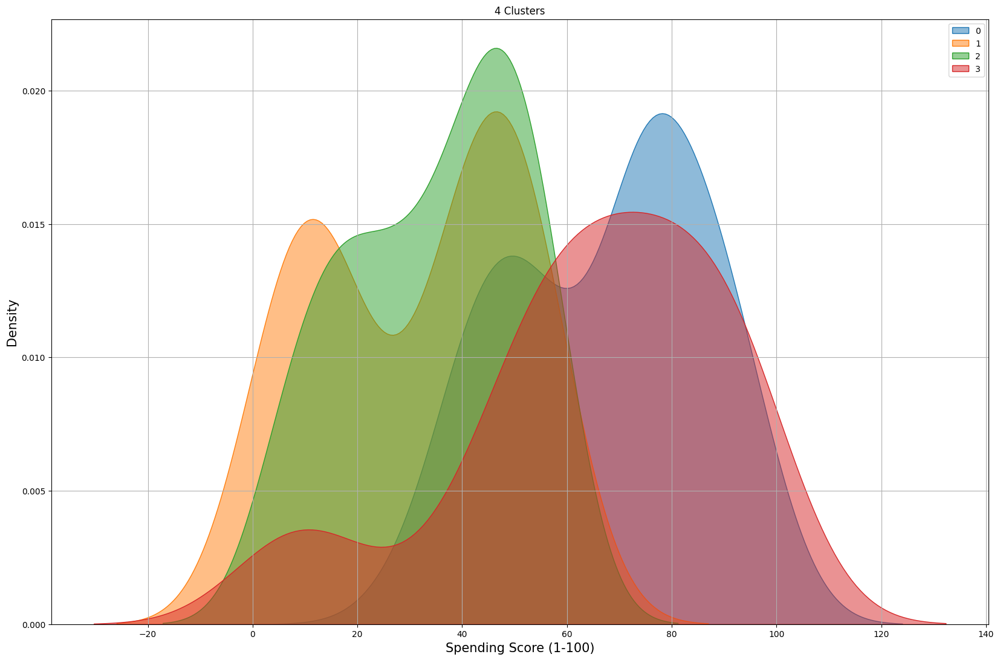

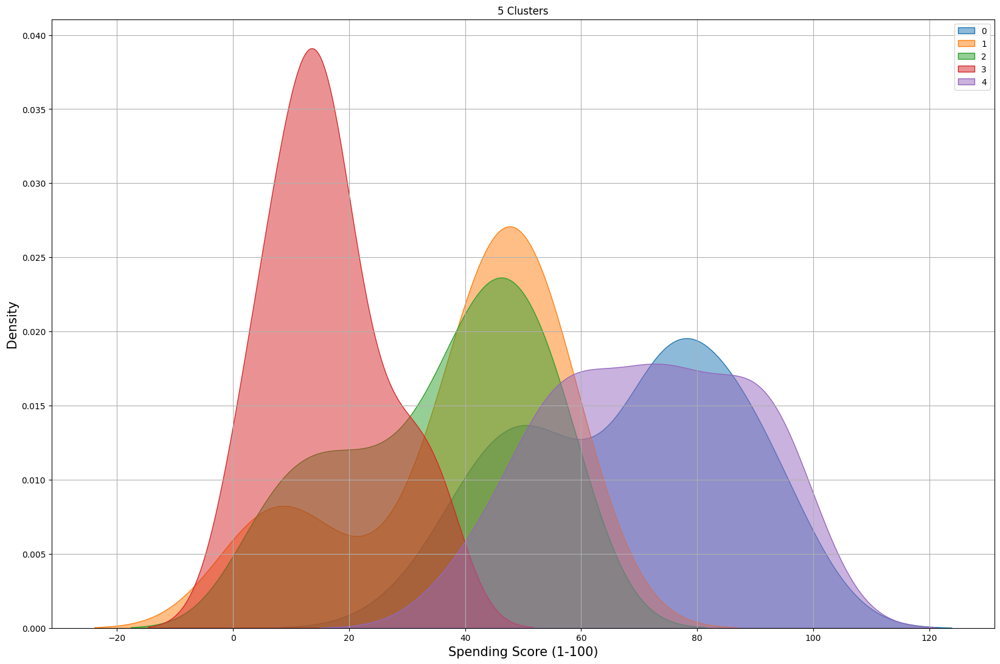

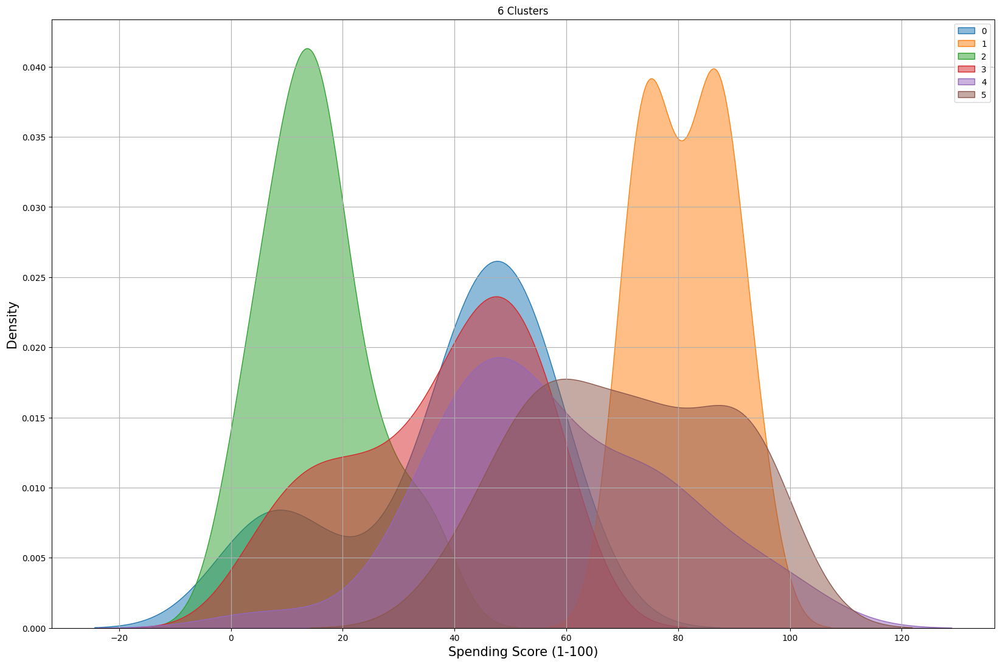

...

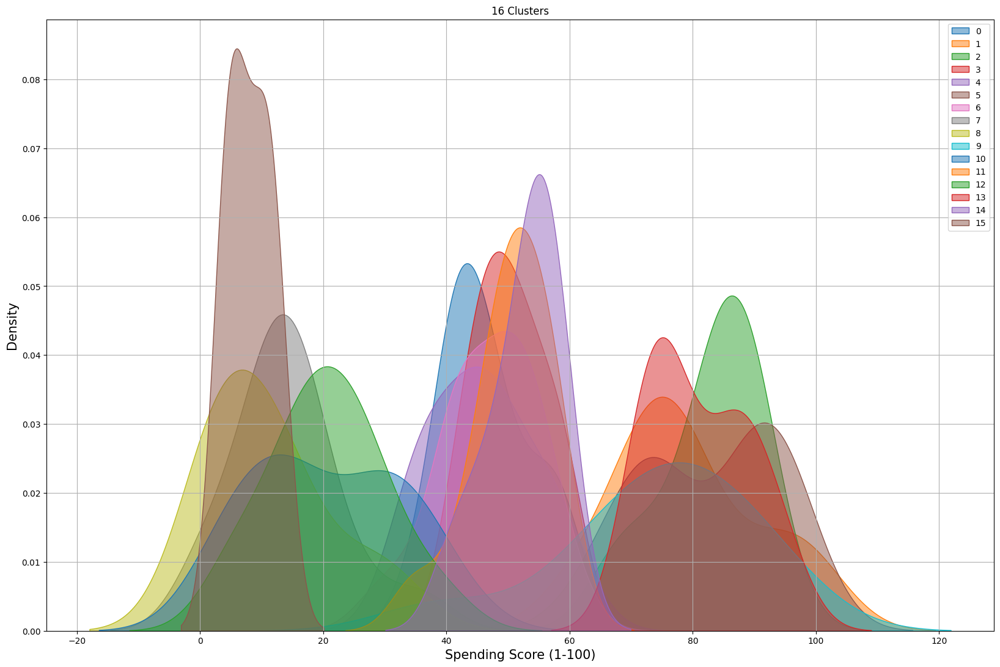

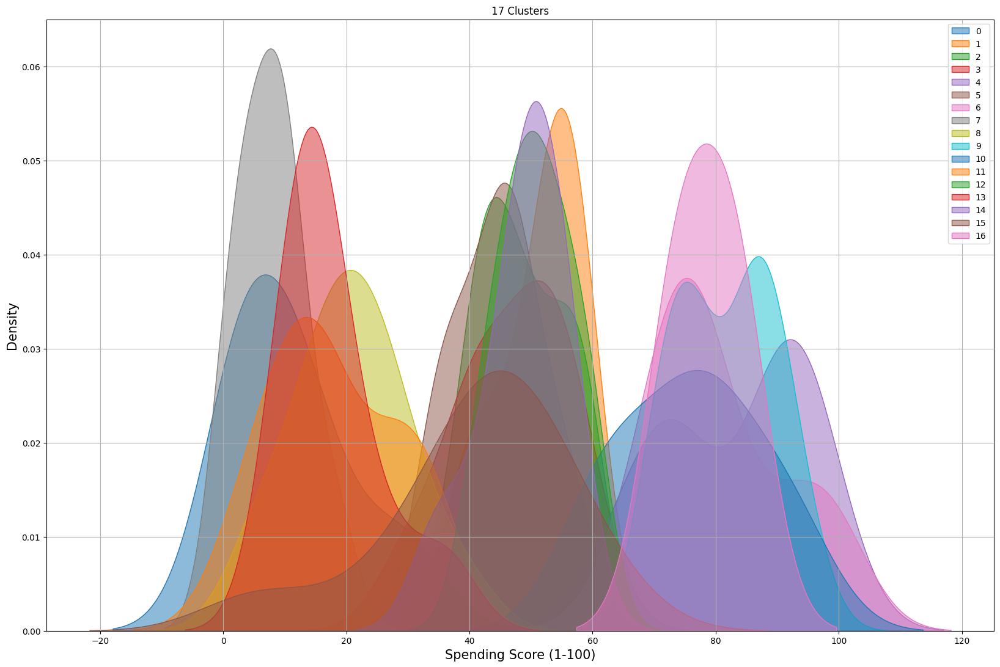

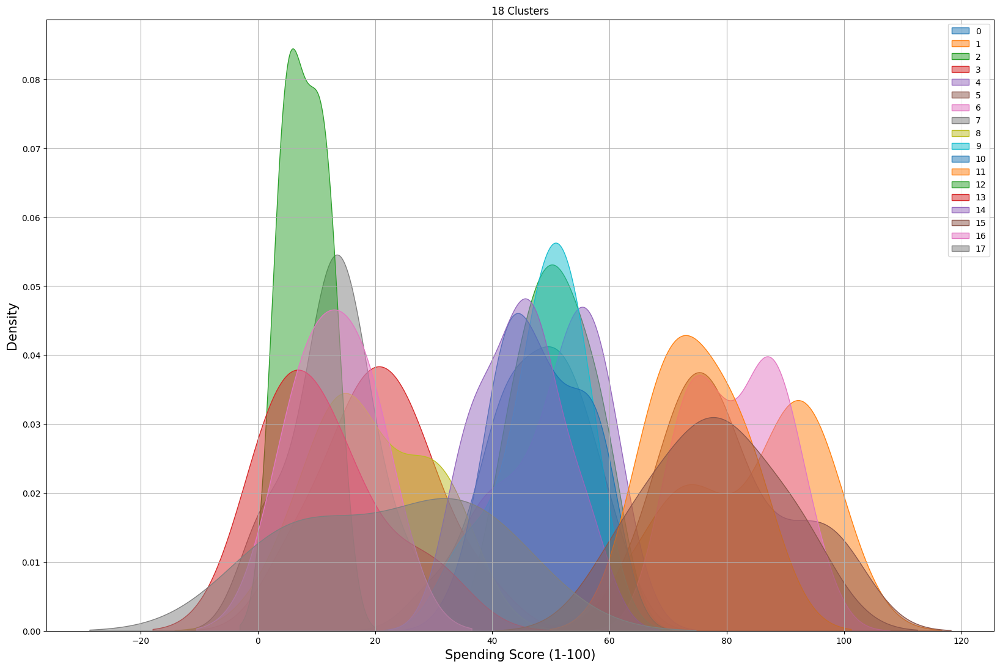

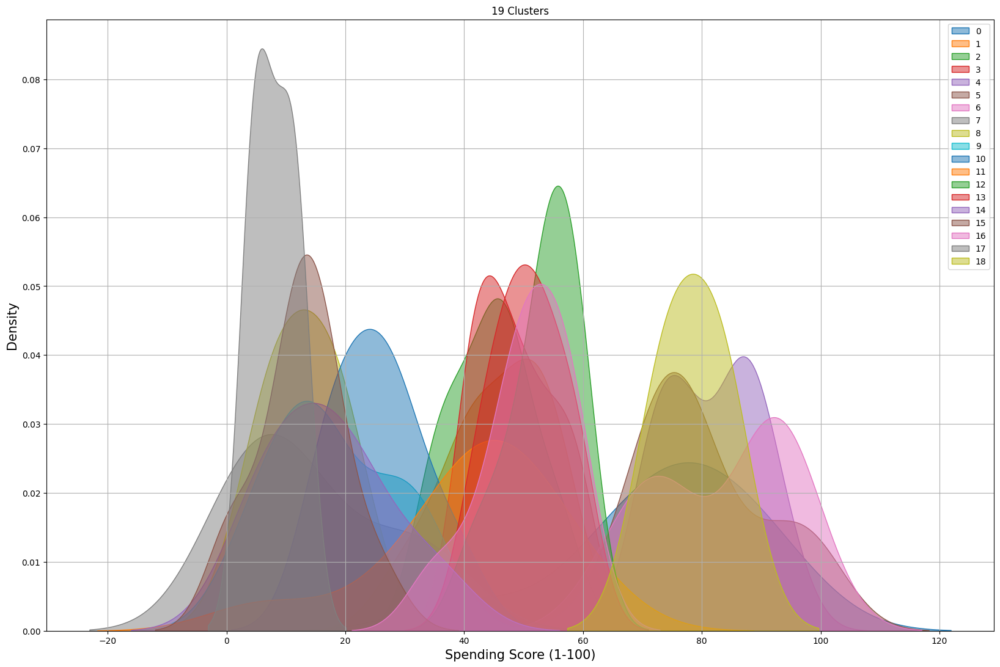

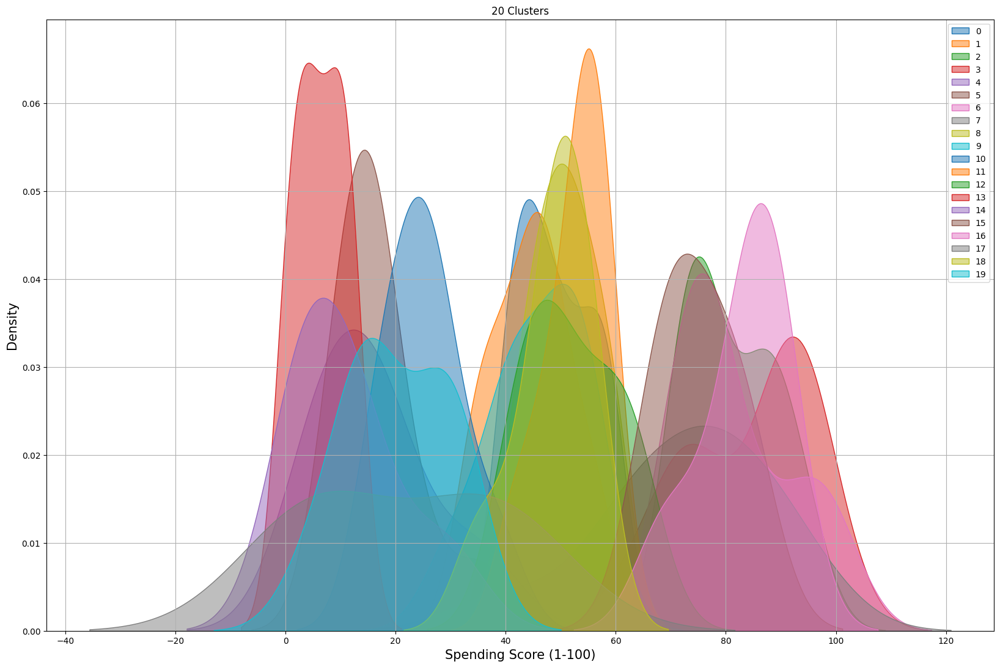

In [31]:
clusters = [k for k in range(2,21)]
for k in clusters:
    kmeans = KMeans(k)
    labels = kmeans.fit_predict(X)
    for lab in np.unique(labels):
        idx = labels == lab
        sns.kdeplot(mc_data_enc[idx]['Spending Score (1-100)'], alpha = 0.5, fill=True, label=lab)
        plt.title(f'{k} Clusters')
    plt.legend()
    plt.grid()
    plt.show()

If we look at distributions for each cluster, we can notice that we could merge the clusters into 3 bigger clusters that could represnt low_score, mid_score and high_score.
<br>
The best merge can be achieved with k = 13 as we can see in the above graphs

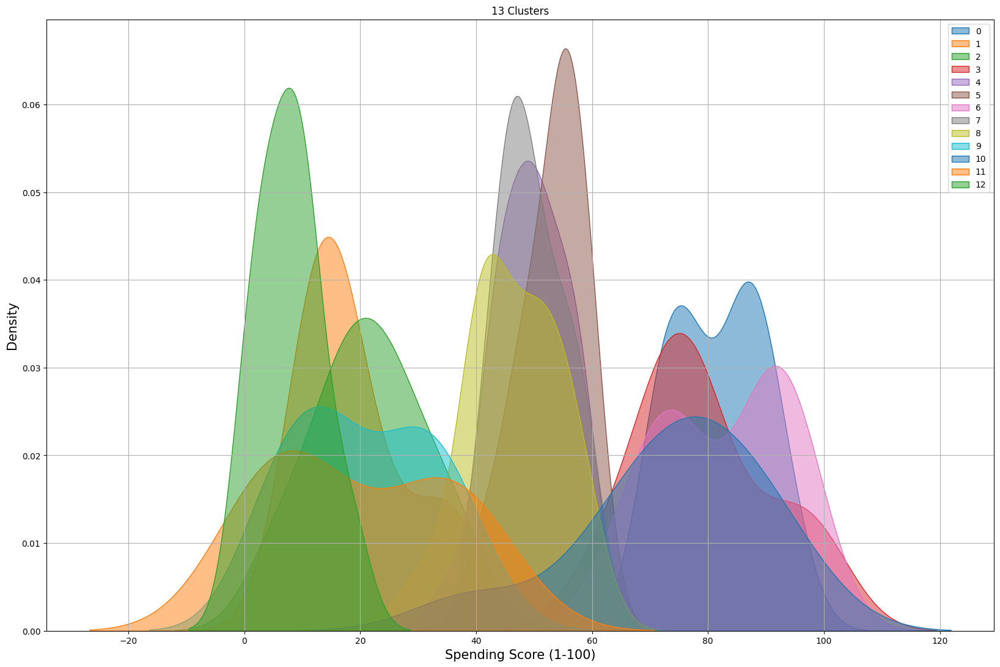

In [32]:
kmeans = KMeans(13)
labels = kmeans.fit_predict(X)
for lab in np.unique(labels):
    idx = labels == lab
    sns.kdeplot(mc_data_enc[idx]['Spending Score (1-100)'], alpha = 0.5, fill=True, label=lab)
    plt.title(f'{13} Clusters')
plt.legend()
plt.grid()

In [33]:
for lab in np.unique(labels):
    idx = labels == lab
    print(lab, mc_data_enc[idx]['Spending Score (1-100)'].median())

0 83.0
1 15.0
2 22.0
3 76.5
4 50.0
5 55.0
6 85.5
7 48.5
8 47.0
9 17.0
10 76.0
11 14.0
12 8.0


In [34]:
idx_low, idx_mid, idx_high = False, False, False
#select index by cluster and merge index with similarities
for lab in np.unique(labels):
    idx = labels == lab
    if (mc_data_enc[idx]['Spending Score (1-100)'].median() < 35):
        idx_low = idx_low | idx
    elif (mc_data_enc[idx]['Spending Score (1-100)'].median() >= 35 and mc_data_enc[idx]['Spending Score (1-100)'].median() < 65):
        idx_mid = idx_mid | idx
    else:
        idx_high = idx_high | idx

cluster_df = mc_data
cluster_df['class'] = 0
cluster_df.loc[idx_mid,'class'] = 1
cluster_df.loc[idx_high,'class'] = 2    

<AxesSubplot: xlabel='Spending Score (1-100)', ylabel='Count'>

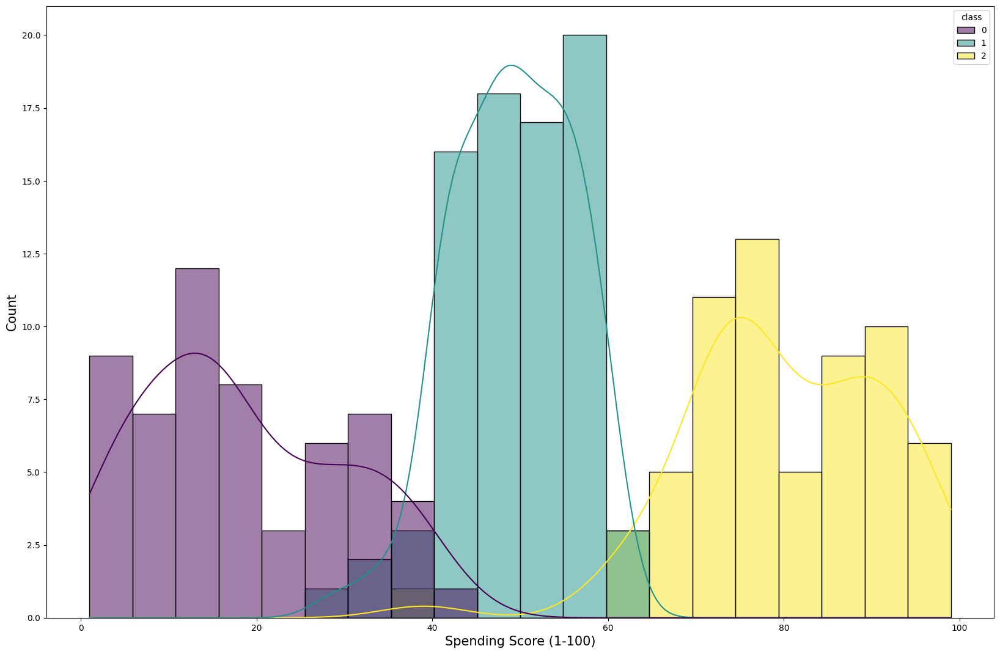

In [35]:
sns.histplot(data=cluster_df, x = 'Spending Score (1-100)', hue = 'class', kde = True, palette='viridis', bins = 20)

<AxesSubplot: xlabel='Spending Score (1-100)', ylabel='Density'>

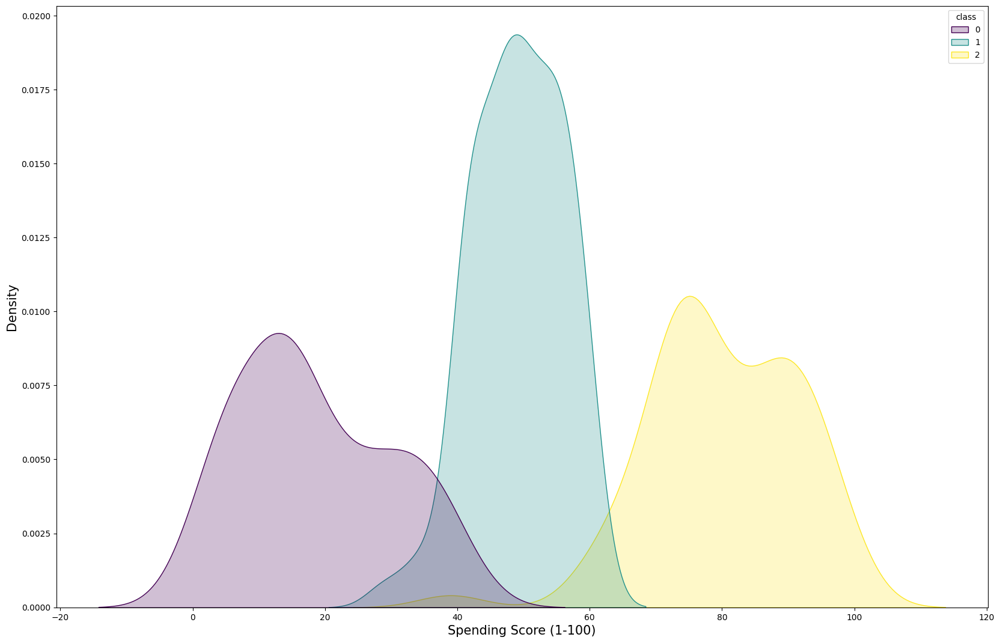

In [36]:
sns.kdeplot(data=cluster_df, x = 'Spending Score (1-100)', hue = 'class', fill = True, palette='viridis')

In [37]:
cluster_df.value_counts('class')

class
1    80
2    63
0    57
dtype: int64

So now we have the data clusterized within 3 macro groups of spending score customers, slightly unbalanced on the class 1.
<br>
When a new customer is inserted, it will be classified in one of the 13 clusters.
<br>
Then depending on the cluster he/she is and based on the conditions of low, mid and high scorer, he/she will be assigned to one of the major cluster groups.